In [ ]:
# # # Price Stability During Economic Events. CONTENT

# # 1. COVID-19: 
   # 1.A. Compare volatility during specific periods (e.g., COVID-19 in 2020).
   # 1.B. Visualisation for each of currencies.

# # 2. Bitcoin Halving. Impact on Cryptocurrency Markets.:
   # 2.A. Bitcoin Halving on May 11, 2020. Daily percentage change in prices for Bitcoin, Ethereum, and Binance Coin during May 2020. 
        # Visualisation for each currency.
   # 2.B. Comparison of Pre-Halving Periods (2020 vs. 2024). Pre-halving 2020 vs. 2024 analysis, emphasizing price volatility. 
        # 2.B.1. Statistical summaries for Bitcoin, Ethereum, Binance Coin, trend visualizations for Bitcoin.
        # 2.B.2. Pre-Halving Periods Analysis (2020 vs. 2024) for Bitcoin. Daily percentage changes. Outliers - "Black Thursday". 
        # 90 Days Pre-Halving: price and percentage changes. Visualisations.
   # 2.C. Comparisons between the impacts of Halving and COVID-19.

# # 3. Ethereum's London Upgrade (EIP-1559) in August 2021.
   # 3.A. Price Trend Analysis (pre and post upgrade). Visualisation.
   # 3.B. Volatility (Price Fluctuation) Comparison.
   # 3.C. T-test to compare Price Behavior before and after the upgrade.

# # 4. China's Crackdown on Cryptocurrencies (2021-2022) - Starting in 2021
   # 4.A. Standard deviation of daily percentage changes for both pre- and post-crackdown periods.
   # 4.B. T-test.
   # 4.C. Compare Bitcoin's price changes to Ethereum and Binance Coin.

# # 5. Crypto Winter 2022.
   # 5.A. Gather Data for SP500.
   # 5.B. Gather Data for Gold (Gold ETF).
   # 5.C. Prepare Data for Bitcoin.
   # 5.D. Merge data for S&P 500, Gold and Bitcoin by date.
   # 5.E. Compare the volatility of cryptocurrencies with traditional assets.
   # 5.F. Broad Comparison: January 2021 – October 2021 vs. November 2021 – December 2022. 
        # Visualisations(interactive histogram and a distplot in Plotly).
   # 5.G. Focused Analysis of the Crash: November 2021 – April 2022 vs. May 2022 – October 2022. 
        # Visualisations(interactive histogram and a distplot in Plotly).
   # 5.H. Correlation between cryptocurrencies and traditional markets before and during the Crypto Winter (Broad and focused comparison).
   # 5.I. Visualisations. Using interactive Scatter plot, 3D Scatter plot, Correlation Hitmap, Bubble Chart.

In [9]:
import pandas as pd

# Load the data
df = pd.read_excel('data/raw/Cryptocurrency/Fixed_Cryptocurrency_Prices.xlsx') 
# The file "Fixed_Cryptocurrency_Prices.xlsx" was created in my Jupyter Notebook "Cryptocurrency Analysis"

In [ ]:
# 1. COVID-19

In [2]:
# 1.A COVID-19 in 2020. Compare volatility

import scipy.stats as stats

# Define periods
covid_start = '2020-03-01'
covid_end = '2020-06-01'

covid_period = df[(df['Date'] >= covid_start) & (df['Date'] <= covid_end)]
non_covid_period = df[~((df['Date'] >= covid_start) & (df['Date'] <= covid_end))]

# Compare variances
f_stat_Bitcoin, p_val_Bitcoin = stats.levene(covid_period['Bitcoin_price'], non_covid_period['Bitcoin_price'])
print("F-test for Bitcoin price volatility during COVID-19:", f_stat_Bitcoin, "p-value:", p_val_Bitcoin)
f_stat_Ethereum, p_val_Ethereum = stats.levene(covid_period['Ethereum_price'], non_covid_period['Ethereum_price'])
print("F-test for Ethereum price volatility during COVID-19:", f_stat_Ethereum, "p-value:", p_val_Ethereum)
f_stat_Binance_Coin, p_val_Binance_Coin = stats.levene(covid_period['Binance_Coin_price'], non_covid_period['Binance_Coin_price'])
print("F-test for Binance Coin price volatility during COVID-19:", f_stat_Binance_Coin, "p-value:", p_val_Binance_Coin)

F-test for Bitcoin price volatility during COVID-19: 149.22664178485564 p-value: 4.805759940422597e-33
F-test for Ethereum price volatility during COVID-19: 156.1065315221632 p-value: 1.968927168561387e-34
F-test for Binance Coin price volatility during COVID-19: 143.06110520159663 p-value: 8.505332341806163e-32


In [ ]:
# The extremely low p-values ​​for all currencies indicate that the variance in currencies prices during COVID-19 
# were significantly different from those during non-COVID periods.

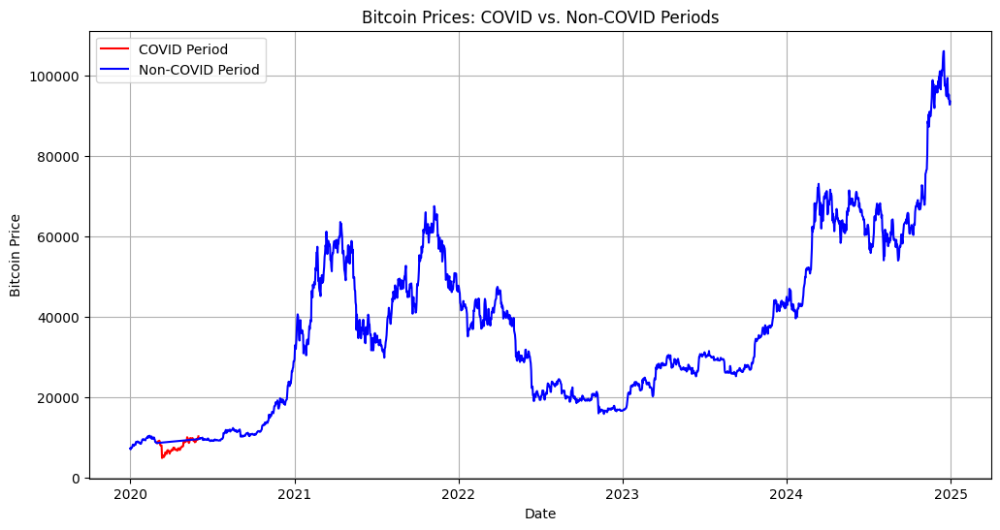

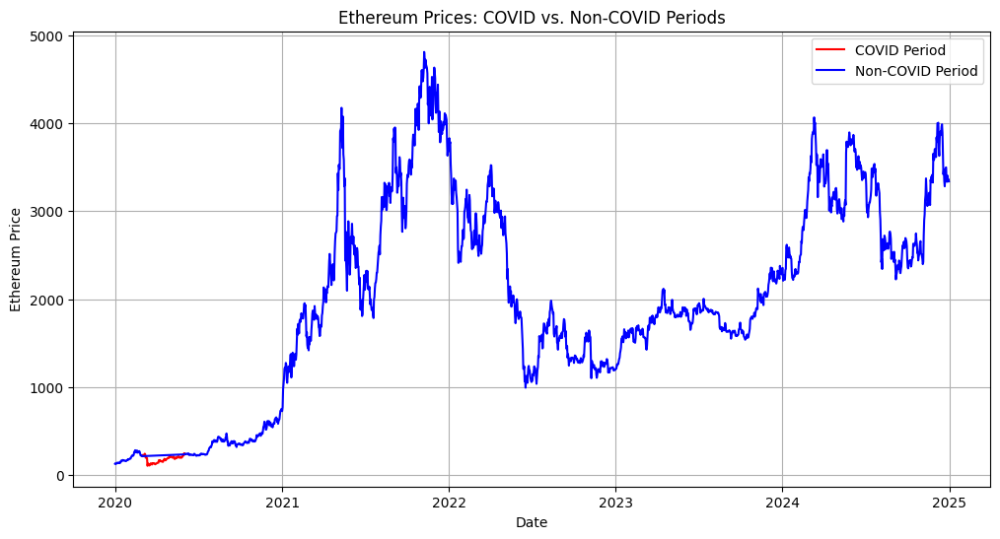

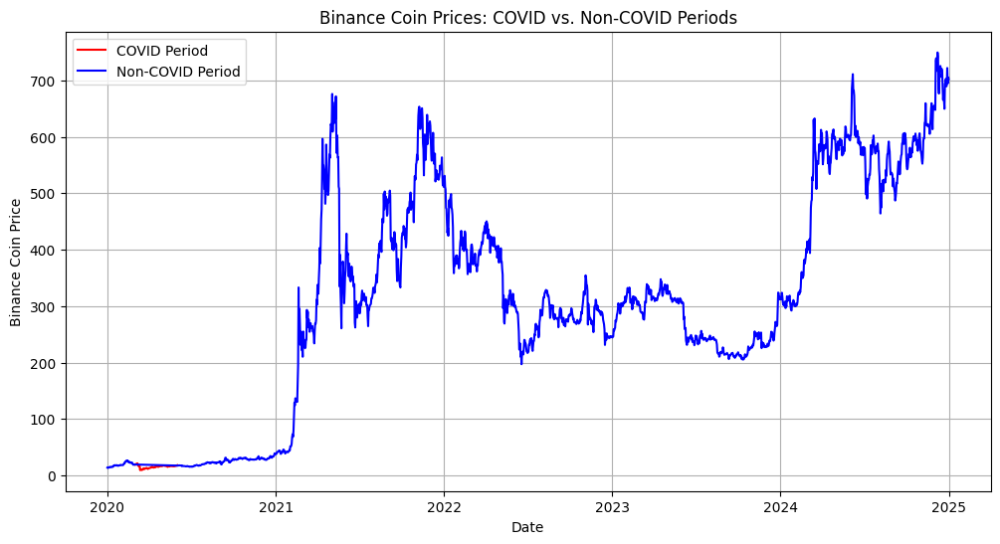

In [3]:
# 2.B. Visualisation

import matplotlib.pyplot as plt

# Plot Bitcoin prices during COVID vs. non-COVID
plt.figure(figsize=(12, 6))
plt.plot(covid_period['Date'], covid_period['Bitcoin_price'], label='COVID Period', color='red')
plt.plot(non_covid_period['Date'], non_covid_period['Bitcoin_price'], label='Non-COVID Period', color='blue')

plt.xlabel('Date')
plt.ylabel('Bitcoin Price')
plt.title('Bitcoin Prices: COVID vs. Non-COVID Periods')
plt.legend()
plt.grid()
plt.show()

# Plot Ethereum prices during COVID vs. non-COVID
plt.figure(figsize=(12, 6))
plt.plot(covid_period['Date'], covid_period['Ethereum_price'], label='COVID Period', color='red')
plt.plot(non_covid_period['Date'], non_covid_period['Ethereum_price'], label='Non-COVID Period', color='blue')

plt.xlabel('Date')
plt.ylabel('Ethereum Price')
plt.title('Ethereum Prices: COVID vs. Non-COVID Periods')
plt.legend()
plt.grid()
plt.show()

# Plot Binance Coin prices during COVID vs. non-COVID
plt.figure(figsize=(12, 6))
plt.plot(covid_period['Date'], covid_period['Binance_Coin_price'], label='COVID Period', color='red')
plt.plot(non_covid_period['Date'], non_covid_period['Binance_Coin_price'], label='Non-COVID Period', color='blue')

plt.xlabel('Date')
plt.ylabel('Binance Coin Price')
plt.title('Binance Coin Prices: COVID vs. Non-COVID Periods')
plt.legend()
plt.grid()
plt.show()

In [ ]:
# Key Conclusion to COVID-19:

# All three cryptocurrencies analyzed showed significantly higher volatility during the pandemic compared to non-COVID periods. This aligns with 
# the expectation that during times of economic uncertainty, markets experience increased fluctuations due to shifts in investor sentiment, 
# risk perception, and market activity.

In [ ]:
# # 2. Bitcoin Halving.

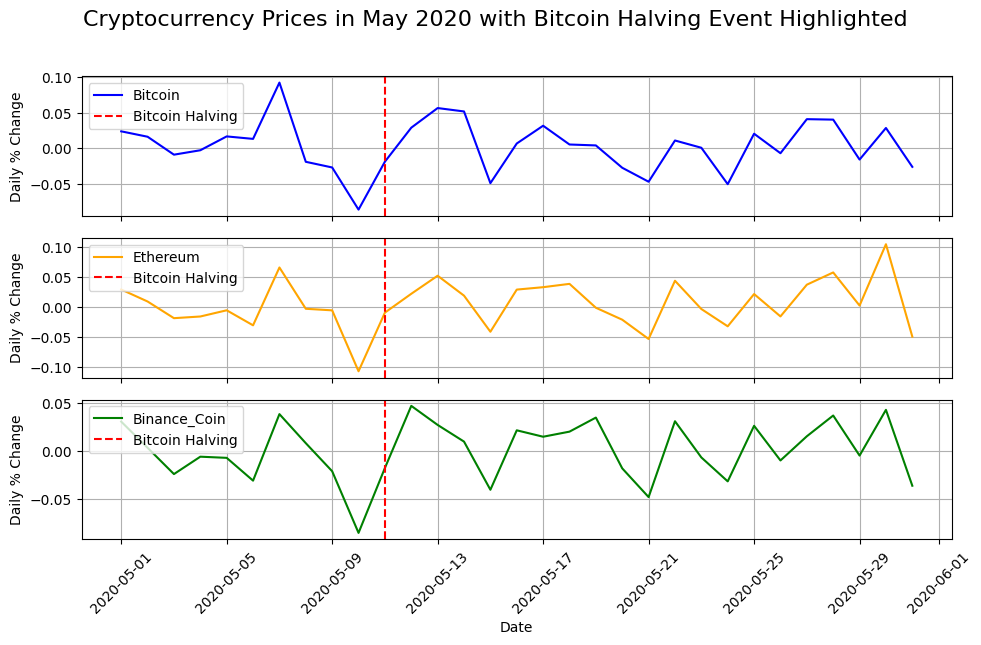

In [4]:
# 2.A. Daily percentage change in prices for Bitcoin, Ethereum, and Binance Coin during May 2020.
# Visualisation for each currency.

import pandas as pd
import matplotlib.pyplot as plt

# Create a backup of the original DataFrame (to return to the original df then, without change columns)
df_original = df.copy()

df['Date'] = pd.to_datetime(df['Date'])

# Daily percentage changes
df['Bitcoin_pct_change'] = df['Bitcoin_price'].pct_change()
df['Ethereum_pct_change'] = df['Ethereum_price'].pct_change()
df['Binance_Coin_pct_change'] = df['Binance_Coin_price'].pct_change()

# Filter data (May 2020)
start_date = '2020-05-01'
end_date = '2020-05-31'
filtered_df = df[(df['Date'] >= start_date) & (df['Date'] <= end_date)]

# Create subplots for each cryptocurrency
fig, axes = plt.subplots(3, 1, figsize=(10, 6), sharex=True)

cryptos = ['Bitcoin', 'Ethereum', 'Binance_Coin']
colors = ['blue', 'orange', 'green']

# Date for Bitcoin Halving Event
halving_date = pd.Timestamp('2020-05-11')

for i, crypto in enumerate(cryptos):
    axes[i].plot(filtered_df['Date'], filtered_df[f'{crypto}_pct_change'], label=crypto, color=colors[i])
    axes[i].axvline(x=halving_date, color='red', linestyle='--', label='Bitcoin Halving')  
    axes[i].set_ylabel('Daily % Change')
    axes[i].legend(loc='upper left')
    axes[i].grid(True)

axes[-1].set_xlabel('Date')
fig.suptitle('Cryptocurrency Prices in May 2020 with Bitcoin Halving Event Highlighted', fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.96]) 

plt.xticks(rotation=45)
plt.show()

In [ ]:
# Market-Wide Impact of May 11:

# The halving event appears to have affected all three cryptocurrencies, with varying degrees of volatility before and after the event.
# This reflects Bitcoin's role as the market leader, influencing the overall cryptocurrency ecosystem.

In [5]:
# To revert to the original DataFrame (without the percentage change columns)
df = df_original

In [ ]:
# 2.B. Comparison of Pre-Halving Periods (2020 vs. 2024) 

# These periods are particularly insightful because halvings are known to significantly influence price trends and market sentiment, 
# with anticipation and speculative activity often peaking in the months before the event. 

# For this analysis, I will use statistical summaries, trend visualizations (for Bitcoin), and overlays of price percentage changes (for Bitcoin) 
# to provide a clear comparison of the market’s reaction in these two timeframes. These methods help to capture both the overall trends 
# and the underlying volatility in the lead-up to the halvings.

Pre-Halving 2020 Summary:
        Bitcoin_price  Ethereum_price  Binance_Coin_price
count     132.000000      132.000000          132.000000
mean     8094.935682      182.801439           16.787348
std      1353.585685       43.448844            3.766787
min      4800.000000      107.820000            9.260000
25%      6950.230000      143.385000           14.370000
50%      8372.550000      173.930000           16.625000
75%      9134.640000      212.312500           18.485000
max     10344.360000      285.150000           26.420000

Pre-Halving 2024 Summary:
        Bitcoin_price  Ethereum_price  Binance_Coin_price
count     110.000000      110.000000          110.000000
mean    55852.296273     2983.597545          426.693636
std     11397.926872      555.685277          120.153085
min     39568.020000     2209.720000          292.100000
25%     43938.845000     2460.490000          312.400000
50%     52198.245000     2999.815000          385.550000
75%     67509.990000     3499.105

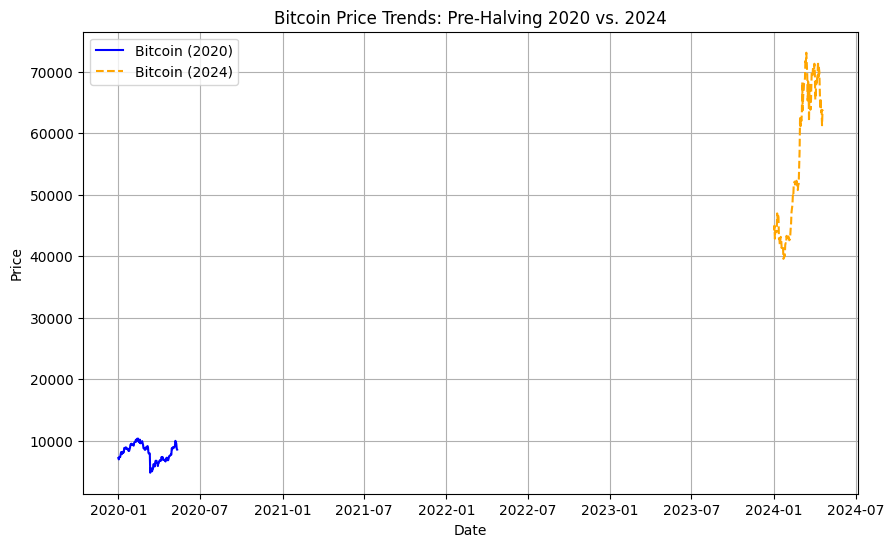

In [11]:
# 2.B.1 Statistical summaries for Bitcoin, Ethereum, Binance Coin, price trend visualization for Bitcoin

import matplotlib.pyplot as plt

# Filter data for pre-Halving periods
pre_halving_2020 = df[(df['Date'] >= '2020-01-01') & (df['Date'] <= '2020-05-11')].copy()
pre_halving_2024 = df[(df['Date'] >= '2024-01-01') & (df['Date'] <= '2024-04-19')].copy()

# Summary statistics
stats_2020 = pre_halving_2020[['Bitcoin_price', 'Ethereum_price', 'Binance_Coin_price']].describe()
stats_2024 = pre_halving_2024[['Bitcoin_price', 'Ethereum_price', 'Binance_Coin_price']].describe()

print("Pre-Halving 2020 Summary:\n", stats_2020)
print("\nPre-Halving 2024 Summary:\n", stats_2024)

plt.figure(figsize=(10, 6))
plt.plot(pre_halving_2020['Date'], pre_halving_2020['Bitcoin_price'], label='Bitcoin (2020)', color='blue')
plt.plot(pre_halving_2024['Date'], pre_halving_2024['Bitcoin_price'], label='Bitcoin (2024)', color='orange', linestyle='--')
plt.xlabel('Date')
plt.ylabel('Price')
plt.title('Bitcoin Price Trends: Pre-Halving 2020 vs. 2024')
plt.legend()
plt.grid()
plt.show()

In [ ]:
# # Conclusions to the summary statistics:

# The pre-Halving periods show a substantial rise in the average prices of Bitcoin, Ethereum, and Binance Coin 
# from 2020 to 2024. 
# This aligns with the broader adoption and growth of the cryptocurrency market. However, increased price volatility highlights 
# greater market uncertainty in 2024. These trends suggest evolving investor sentiment and market dynamics over time.

In [ ]:
# # Conclusions to the chart:

# The 2020 pre-Halving period exhibits modest price activity, reflecting a less mature market.
# The 2024 pre-Halving period, in contrast, shows significantly higher prices with increased volatility, indicating greater market attention 
# and a larger investor base.

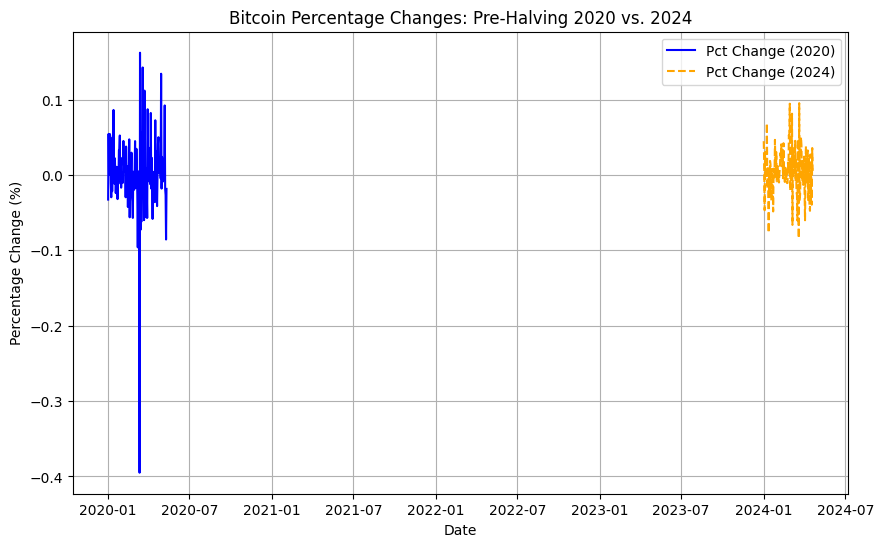

In [12]:
# 2.B.2 Pre-Halving Periods Analysis (2020 vs. 2024) for Bitcoin. Daily percentage changes. Outliers - "Black Thursday". 
# 90 Days Pre-Halving: price and percentage changes. Visualisations.

# Create a backup of the original DataFrame (to return to the original df then, without change columns)
df_original = df.copy()

# Calculate daily percentage changes
df['Bitcoin_pct_change'] = df['Bitcoin_price'].pct_change()

# Filter data for pre-Halving periods
pre_halving_2020 = df[(df['Date'] >= '2020-01-01') & (df['Date'] <= '2020-05-11')].copy()
pre_halving_2024 = df[(df['Date'] >= '2024-01-01') & (df['Date'] <= '2024-04-19')].copy()

# Let's plot daily percentage changes for Bitcoin prices in both the 2020 and 2024 pre-halving periods

plt.figure(figsize=(10, 6))
plt.plot(pre_halving_2020['Date'], pre_halving_2020['Bitcoin_pct_change'], label='Pct Change (2020)', color='blue')
plt.plot(pre_halving_2024['Date'], pre_halving_2024['Bitcoin_pct_change'], label='Pct Change (2024)', color='orange', linestyle='--')
plt.xlabel('Date')
plt.ylabel('Percentage Change (%)')
plt.title('Bitcoin Percentage Changes: Pre-Halving 2020 vs. 2024')
plt.legend()
plt.grid()
plt.show()

In [ ]:
# The current x-axis includes data outside the pre-halving periods.

# Let's use the Z-score method to identify how far a data point is from the mean in terms of standard deviations. 
# Outliers typically have a Z-score greater than 3 or less than -3.

In [13]:
from scipy.stats import zscore

# Calculate z-scores for Bitcoin percentage changes in 2020 and 2024
pre_halving_2020.loc[:, 'z_score'] = zscore(pre_halving_2020['Bitcoin_pct_change'].dropna())
pre_halving_2024.loc[:, 'z_score'] = zscore(pre_halving_2024['Bitcoin_pct_change'].dropna())

# Identify outliers (Z-score > 3 or < -3)
outliers_2020 = pre_halving_2020[pre_halving_2020['z_score'].abs() > 3]
outliers_2024 = pre_halving_2024[pre_halving_2024['z_score'].abs() > 3]

print("Outliers in 2020:")
print(outliers_2020)

print("Outliers in 2024:")
print(outliers_2024)

Outliers in 2020:
         Date  Bitcoin_price  Ethereum_price  Binance_Coin_price  \
71 2020-03-12         4800.0          107.82                9.26   

    Bitcoin_pct_change   z_score  
71           -0.395048 -7.419404  
Outliers in 2024:
Empty DataFrame
Columns: [Date, Bitcoin_price, Ethereum_price, Binance_Coin_price, Bitcoin_pct_change, z_score]
Index: []


In [ ]:
# In 2020, the date March 12, 2020, stands out as an outlier. 
# In 2024, there are no outliers detected based on the Z-score method.

# Let's highlight outliers on the plot for better visualization

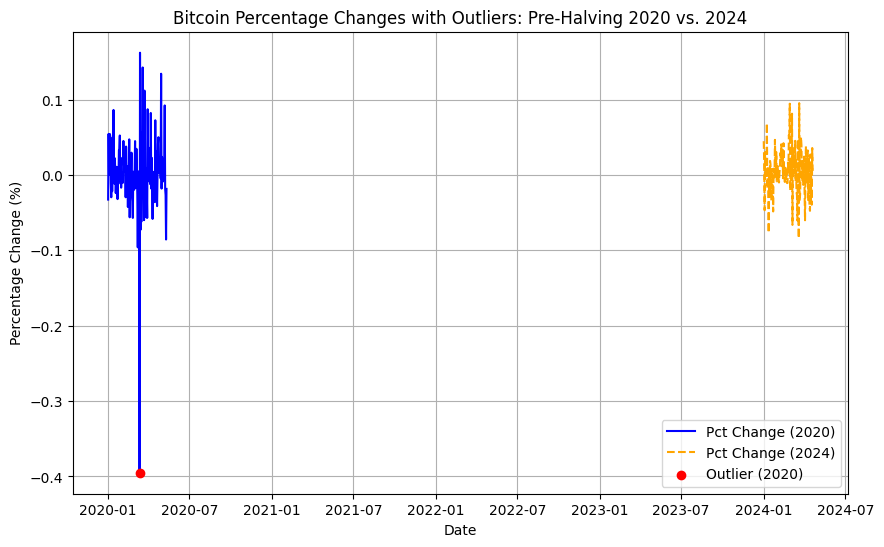

In [9]:
plt.figure(figsize=(10, 6))

# Plot percentage changes
plt.plot(pre_halving_2020['Date'], pre_halving_2020['Bitcoin_pct_change'], label='Pct Change (2020)', color='blue')
plt.plot(pre_halving_2024['Date'], pre_halving_2024['Bitcoin_pct_change'], label='Pct Change (2024)', color='orange', linestyle='--')

# Highlight the 2020 outlier
outlier_2020 = pre_halving_2020[pre_halving_2020['Date'] == '2020-03-12']
plt.scatter(outlier_2020['Date'], outlier_2020['Bitcoin_pct_change'], color='red', label='Outlier (2020)', zorder=5)

plt.xlabel('Date')
plt.ylabel('Percentage Change (%)')
plt.title('Bitcoin Percentage Changes with Outliers: Pre-Halving 2020 vs. 2024')
plt.legend()
plt.grid()
plt.show()

In [ ]:
# I checked the historical data regarding the reasons for this discovery.

# On March 12, 2020, a day now known as "Black Thursday", the cryptocurrency market experienced an unprecedented crash. 
# Bitcoin's price plummeted by approximately 50%, dropping from around $8,000 to as low as $3,600 within hours. 
# This dramatic decline was primarily triggered by a cascade of long position liquidations on major cryptocurrency exchanges.

In [ ]:
# Let's temporary remove the outliers and explore more deeply pre-halving periods: 90 days before May 11, 2020 and 90 days before April 20, 2024

In [10]:
# Define pre-halving periods
start_2020 = '2020-02-11'  # 90 days before May 11, 2020
end_2020 = '2020-05-10'

start_2024 = '2024-01-20'  # 90 days before April 20, 2024
end_2024 = '2024-04-19'

# Filter the data for the defined periods
filtered_2020 = pre_halving_2020[(pre_halving_2020['Date'] >= start_2020) & (pre_halving_2020['Date'] <= end_2020)]
filtered_2024 = pre_halving_2024[(pre_halving_2024['Date'] >= start_2024) & (pre_halving_2024['Date'] <= end_2024)]

In [11]:
# Remove the outlier from 2020 data
filtered_2020_clean = filtered_2020[filtered_2020['z_score'].abs() <= 3]

# Remove the outlier from 2024 data (if any exist, for generalization)
filtered_2024_clean = filtered_2024[filtered_2024['z_score'].abs() <= 3]

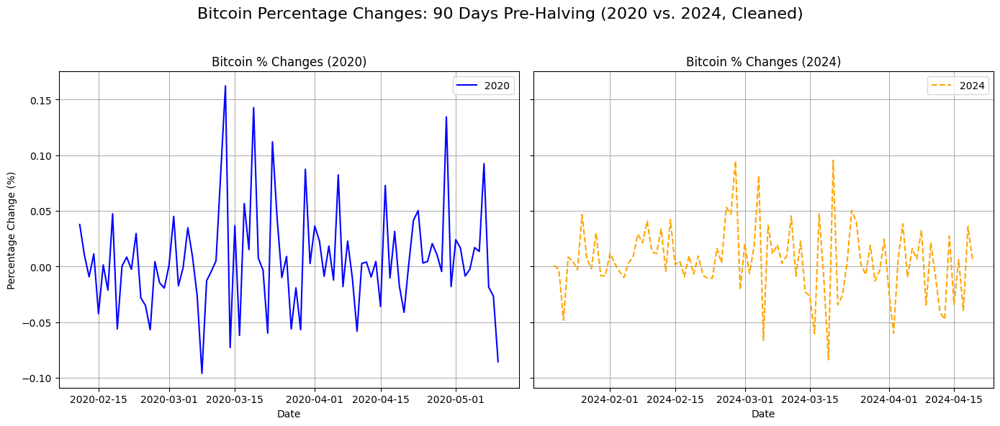

In [12]:
# Create a figure 
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# Plot for the 2020 pre-halving period
axes[0].plot(filtered_2020_clean['Date'], filtered_2020_clean['Bitcoin_pct_change'], color='blue', label='2020')
axes[0].set_title('Bitcoin % Changes (2020)')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Percentage Change (%)')
axes[0].legend()
axes[0].grid()

# Plot for the 2024 pre-halving period
axes[1].plot(filtered_2024_clean['Date'], filtered_2024_clean['Bitcoin_pct_change'], color='orange', label='2024', linestyle='--')
axes[1].set_title('Bitcoin % Changes (2024)')
axes[1].set_xlabel('Date')
axes[1].legend()
axes[1].grid()


plt.suptitle('Bitcoin Percentage Changes: 90 Days Pre-Halving (2020 vs. 2024, Cleaned)', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [ ]:
# The 2020 pre-halving period was marked by more extreme percentage changes, indicating higher levels of market uncertainty or speculative behavior.
# The 2024 pre-halving period shows more tempered fluctuations, reflecting possible market maturity and reduced sensitivity to short-term events.

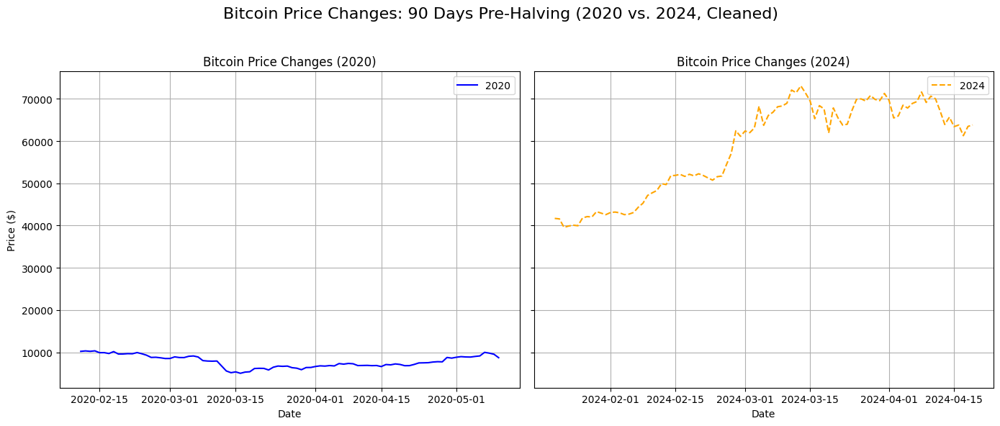

In [13]:
# Create a figure 
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# Plot for the 2020 pre-halving period
axes[0].plot(filtered_2020_clean['Date'], filtered_2020_clean['Bitcoin_price'], color='blue', label='2020')
axes[0].set_title('Bitcoin Price Changes (2020)')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Price ($)')
axes[0].legend()
axes[0].grid()

# Plot for the 2024 pre-halving period
axes[1].plot(filtered_2024_clean['Date'], filtered_2024_clean['Bitcoin_price'], color='orange', label='2024', linestyle='--')
axes[1].set_title('Bitcoin Price Changes (2024)')
axes[1].set_xlabel('Date')
axes[1].legend()
axes[1].grid()


plt.suptitle('Bitcoin Price Changes: 90 Days Pre-Halving (2020 vs. 2024, Cleaned)', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [ ]:
# The 2020 pre-halving period was marked by stagnation and a lack of upward momentum, with external events (e.g., the pandemic) playing a dominant role 
# in influencing price movement.
# The 2024 pre-halving period shows significant growth, highlighting increased market confidence and a greater understanding 
# of the halving's economic implications.

In [ ]:
# General Conclusion to Bitcoin Halving:

# This evolution underscores a shift in market dynamics, with cryptocurrencies becoming more integrated into the global financial system 
# between 2020 and 2024.

In [ ]:
# 2.C. Comparisons between the impacts of Halving and COVID-19

# The impacts of Bitcoin halving and the COVID-19 pandemic on the cryptocurrency market highlight contrasting dynamics. 
# While halving events typically drive gradual price increases and heightened speculative interest due to reduced supply, 
# the COVID-19 crisis in 2020 caused a sharp, short-term market crash followed by a rapid recovery, driven by macroeconomic factors 
# such as stimulus measures and increased demand for digital assets. 

# Together, these events illustrate the interplay of intrinsic (halving) and external (COVID-19) factors in shaping Bitcoin's price behavior.

# Looking ahead, the next halving is estimated to occur in 2028, providing future opportunities to evaluate how market dynamics 
# evolve across multiple halving events.

In [ ]:
# # 3. Ethereum's London Upgrade (EIP-1559) in August 2021.

# Impact of the Ethereum upgrade on price behavior and volatility compared to other periods in Ethereum's history.

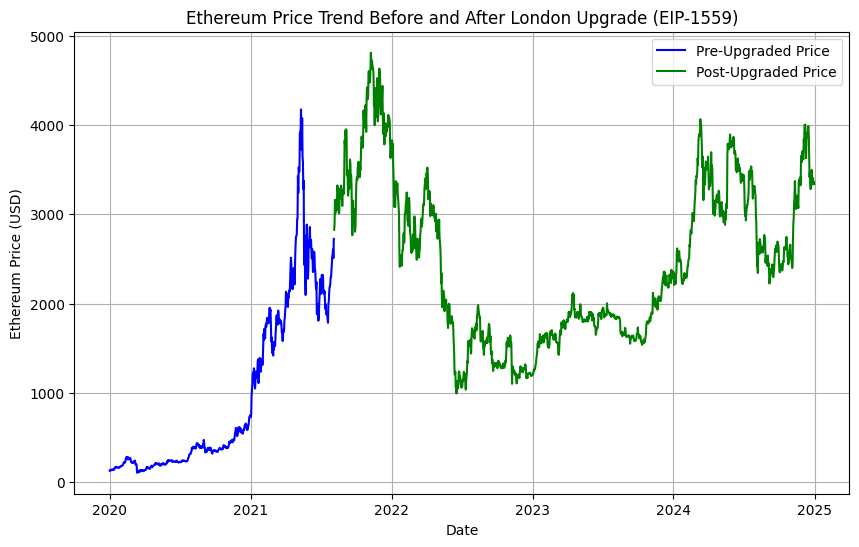

In [17]:
# 3.A. Price Trend Analysis
# Plot the price trends of Ethereum before and after the upgrade. 

import matplotlib.pyplot as plt

# Create two subsets of the data: pre and post upgrade
pre_upgrade = df[df['Date'] < '2021-08-05'].copy()
post_upgrade = df[df['Date'] >= '2021-08-05'].copy()

plt.figure(figsize=(10, 6))
plt.plot(pre_upgrade['Date'], pre_upgrade['Ethereum_price'], label='Pre-Upgraded Price', color='blue')
plt.plot(post_upgrade['Date'], post_upgrade['Ethereum_price'], label='Post-Upgraded Price', color='green')
plt.title("Ethereum Price Trend Before and After London Upgrade (EIP-1559)")
plt.xlabel("Date")
plt.ylabel("Ethereum Price (USD)")
plt.legend()
plt.grid()
plt.show()

In [ ]:
# The chart visualized that post-upgrade volatility decreased compared to the pre-upgrade period. 
# This suggests the market perceived the upgrade as reducing uncertainty in Ethereum's ecosystem.

In [17]:
# 3.B. Volatility (Price Fluctuation) Comparison
# Calculate the standard deviation of Ethereum's daily returns (percentage changes) for the pre and post-upgrade periods to measure volatility.

In [15]:
df['Ethereum_pct_change'] = df['Ethereum_price'].pct_change()

In [18]:
# Calculate percentage change for both pre and post upgrade periods using .loc
pre_upgrade.loc[:, 'Ethereum_pct_change'] = pre_upgrade['Ethereum_price'].pct_change()
post_upgrade.loc[:, 'Ethereum_pct_change'] = post_upgrade['Ethereum_price'].pct_change()

# Calculate volatility for both periods
pre_volatility = pre_upgrade['Ethereum_pct_change'].std()
post_volatility = post_upgrade['Ethereum_pct_change'].std()

print(f"Pre-Upgrade Volatility: {pre_volatility}")
print(f"Post-Upgrade Volatility: {post_volatility}")

Pre-Upgrade Volatility: 0.05686470026428978
Post-Upgrade Volatility: 0.0365999760006636


In [ ]:
# The results supports the chart findings, that that Ethereum's price exhibited higher volatility before the upgrade 
# and became more stable after the upgrade.

In [ ]:
# 3.C. Statistical Test to Compare Price Behavior
# Perform a t-test to compare the means of daily returns before and after the upgrade.

In [17]:
from scipy import stats

pre_returns = pre_upgrade['Ethereum_pct_change'].dropna()
post_returns = post_upgrade['Ethereum_pct_change'].dropna()

t_stat, p_value = stats.ttest_ind(pre_returns, post_returns)

print(f"T-statistic: {t_stat}")
print(f"P-value: {p_value}")

T-statistic: 2.7642301376347906
P-value: 0.005763144214497959


In [ ]:
# The t-test indicates that the volatility in Ethereum prices before and after the upgrade is significantly different. 
# This aligns with my previous finding that post-upgrade volatility is lower. It is an evidence that the Ethereum London upgrade 
# may have had a stabilizing effect on Ethereum's price, reducing its volatility.

In [ ]:
# General Conclusion to Ethereum's London Upgrade: 
# The upgrade appears to have contributed positively to Ethereum's long-term price trend by addressing critical concerns related 
# to transaction costs and supply dynamics.

In [ ]:
# # 4. China's Crackdown on Cryptocurrencies (2021-2022) - Starting in 2021.

# May 2021 Mining Ban.
# For the May 2021 Mining Ban, the crackdown gained momentum after China's State Council announced restrictions on May 21, 2021.

In [18]:
df['Binance_Coin_pct_change'] = df['Binance_Coin_price'].pct_change()

In [19]:
# Split the daily price data into pre-crackdown and post-crackdown periods around the key dates.

pre_crackdown = df[(df['Date'] >= '2021-01-01') & (df['Date'] < '2021-05-21')]
post_crackdown = df[(df['Date'] >= '2021-05-21') & (df['Date'] <= '2021-12-31')]

In [20]:
# 4.A. Calculate the standard deviation of daily percentage changes for both pre- and post-crackdown periods.

pre_volatility = pre_crackdown['Bitcoin_pct_change'].std()
post_volatility = post_crackdown['Bitcoin_pct_change'].std()
print(f"Pre-Crackdown Volatility: {pre_volatility}")
print(f"Post-Crackdown Volatility: {post_volatility}")

Pre-Crackdown Volatility: 0.04836716198076108
Post-Crackdown Volatility: 0.038397036581634285


In [ ]:
# The volatility values you've calculated for Bitcoin's returns before and after the crackdown show that the volatility decreased post-crackdown.
# This suggests that the cryptocurrency market may have experienced more stable conditions after the crackdown in 2021, 
# which could be linked to factors like regulatory uncertainty or other market dynamics. 

In [21]:
# 4.B. T-test, to check if the mean daily returns differ significantly between the two periods.

from scipy.stats import ttest_ind

pre_returns = pre_crackdown['Bitcoin_pct_change'].dropna()
post_returns = post_crackdown['Bitcoin_pct_change'].dropna()

t_stat, p_value = ttest_ind(pre_returns, post_returns)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

T-statistic: 0.49102966556750105, P-value: 0.6237021888071318


In [ ]:
# Since the p-value is greater than the typical significance threshold (usually 0.05), we would fail to reject the null hypothesis. 
# This means that, based on the data, there is no statistically significant difference in Bitcoin's volatility before and after the crackdown, 
# suggesting that the crackdown may not have had a notable effect on Bitcoin's price volatility during this period.

In [22]:
# check

print(pre_crackdown.columns)
print(post_crackdown.columns)

Index(['Date', 'Bitcoin_price', 'Ethereum_price', 'Binance_Coin_price',
       'Bitcoin_pct_change', 'Ethereum_pct_change', 'Binance_Coin_pct_change'],
      dtype='object')
Index(['Date', 'Bitcoin_price', 'Ethereum_price', 'Binance_Coin_price',
       'Bitcoin_pct_change', 'Ethereum_pct_change', 'Binance_Coin_pct_change'],
      dtype='object')


In [23]:
# 4.C. Compare Bitcoin's price changes to Ethereum and Binance Coin to check if the mining ban specifically affected Bitcoin or the market as a whole.

btc_eth_corr_pre = pre_crackdown[['Bitcoin_pct_change', 'Ethereum_pct_change']].corr()
btc_eth_corr_post = post_crackdown[['Bitcoin_pct_change', 'Ethereum_pct_change']].corr()

btc_bnb_corr_pre = pre_crackdown[['Bitcoin_pct_change', 'Binance_Coin_pct_change']].corr()
btc_bnb_corr_post = post_crackdown[['Bitcoin_pct_change', 'Binance_Coin_pct_change']].corr()

print("Bitcoin-Ethereum Correlation Pre-Crackdown:")
print(btc_eth_corr_pre)
print("Bitcoin-Ethereum Correlation Post-Crackdown:")
print(btc_eth_corr_post)

print("Bitcoin-Binance Coin Correlation Pre-Crackdown:")
print(btc_bnb_corr_pre)
print("Bitcoin-Binance Coin Correlation Post-Crackdown:")
print(btc_bnb_corr_post)

Bitcoin-Ethereum Correlation Pre-Crackdown:
                     Bitcoin_pct_change  Ethereum_pct_change
Bitcoin_pct_change             1.000000             0.709394
Ethereum_pct_change            0.709394             1.000000
Bitcoin-Ethereum Correlation Post-Crackdown:
                     Bitcoin_pct_change  Ethereum_pct_change
Bitcoin_pct_change             1.000000             0.823515
Ethereum_pct_change            0.823515             1.000000
Bitcoin-Binance Coin Correlation Pre-Crackdown:
                         Bitcoin_pct_change  Binance_Coin_pct_change
Bitcoin_pct_change                 1.000000                 0.528381
Binance_Coin_pct_change            0.528381                 1.000000
Bitcoin-Binance Coin Correlation Post-Crackdown:
                         Bitcoin_pct_change  Binance_Coin_pct_change
Bitcoin_pct_change                 1.000000                 0.751411
Binance_Coin_pct_change            0.751411                 1.000000


In [ ]:
# The correlation between Bitcoin and both Ethereum and Binance Coin increased after the crackdown, 
# suggesting that the market behavior of these cryptocurrencies became more aligned post-crackdown.
# This could indicate that the regulatory uncertainty may have caused a convergence in how the markets of Bitcoin, Ethereum, and Binance Coin 
# responded to price changes.

In [ ]:
# General Conclusion to China's Crackdown:
# The price of Bitcoin and other cryptocurrencies showed the market's ability to adapt, with prices recovering and even increasing 
# as other regions absorbed the mining activity. This demonstrated the growing decentralization of the cryptocurrency ecosystem, 
# reducing its reliance on any single country.

In [ ]:
# # # 5.Crypto Winter 2022 (November 2021 - December 2022).

# The current decline of the cryptocurrency market. In 2022, the value of popular cryptocurrencies declined precipitously 
# with a series of dramatic events. This included the failure of multiple stablecoins, such as TerraUSD and Luna in May, 
# and the collapse of FTX in November.
# Crypto winter isn't just about lower values for cryptocurrency assets; it's also about lower overall trading volume over a period.

# Bitcoin began to fall from a high of around $65,000 in November of 2021. About a year later, in November of 2022, it reached a low of around $16,000. 
# As of late January 2023, it has rebounded to around $23,000.

# May 2022 was the key event: The Terra (LUNA) collapse triggered mass liquidations in crypto markets, contributing to sharp declines.
# Bitcoin’s decline accelerated after May, dropping from ~$39K in early May to ~$17K by June–December 2022.

# For my study, I analyze a two-year period from January 2021 to December 2022. I divide this period into two research approaches: 
  # 1. Broad Comparison: January 2021 – October 2021 vs. November 2021 – December 2022.,
  # 2. Focused Analysis of the Crash: November 2021 – April 2022 vs. May 2022 – October 2022.

In [1]:
import pandas as pd

In [2]:
# 5.A. Gather Data for S&P 500

df_SP500 = pd.read_excel('data/raw/Cryptocurrency/SP500.xlsx')
# S&P 500 Index data sourced from the Federal Reserve Economic Data (FRED) database

In [25]:
# Check the first few rows
print(df_SP500.head())

  observation_date    SP500
0       2021-01-04  3700.65
1       2021-01-05  3726.86
2       2021-01-06  3748.14
3       2021-01-07  3803.79
4       2021-01-08  3824.68


In [26]:
# Check for missing values
print(df_SP500.isnull().sum())

observation_date     0
SP500               17
dtype: int64


In [27]:
print(df_SP500[df_SP500['SP500'].isnull()])

    observation_date  SP500
10        2021-01-18    NaN
30        2021-02-15    NaN
64        2021-04-02    NaN
105       2021-05-31    NaN
130       2021-07-05    NaN
175       2021-09-06    NaN
233       2021-11-25    NaN
254       2021-12-24    NaN
270       2022-01-17    NaN
295       2022-02-21    NaN
334       2022-04-15    NaN
365       2022-05-30    NaN
380       2022-06-20    NaN
390       2022-07-04    NaN
435       2022-09-05    NaN
493       2022-11-24    NaN
515       2022-12-26    NaN


In [3]:
df_SP500_clean = df_SP500.dropna()

In [4]:
# check 

print(df_SP500_clean.isnull().sum())

observation_date    0
SP500               0
dtype: int64


In [6]:
# Rename columns in this DataFrame
df_SP500_clean = df_SP500_clean.copy()  # Make a copy of the DataFrame
df_SP500_clean.rename(columns={"observation_date": "Date", "SP500": "SP500_Price"}, inplace=True)

In [235]:
print(df_SP500_clean.head())

         Date  SP500_Price
0  2021-01-04      3700.65
1  2021-01-05      3726.86
2  2021-01-06      3748.14
3  2021-01-07      3803.79
4  2021-01-08      3824.68


In [31]:
print("Before cleaning:", df_SP500.shape)

print("After cleaning:", df_SP500_clean.shape)

Before cleaning: (520, 2)
After cleaning: (503, 2)


In [7]:
# Check and format the Date column
df_SP500_clean['Date'] = pd.to_datetime(df_SP500_clean['Date'])

In [33]:
# Save the updated DataFrame
df_SP500_clean.to_excel("data/raw/Cryptocurrency/SP500_cleaned.xlsx", index=False)

In [8]:
# Set the Date column as the Index
df_SP500_clean.set_index('Date', inplace=True)

In [35]:
print(df_SP500_clean.head())

            SP500_Price
Date                   
2021-01-04      3700.65
2021-01-05      3726.86
2021-01-06      3748.14
2021-01-07      3803.79
2021-01-08      3824.68


In [9]:
print(df_SP500_clean.shape)

(503, 1)


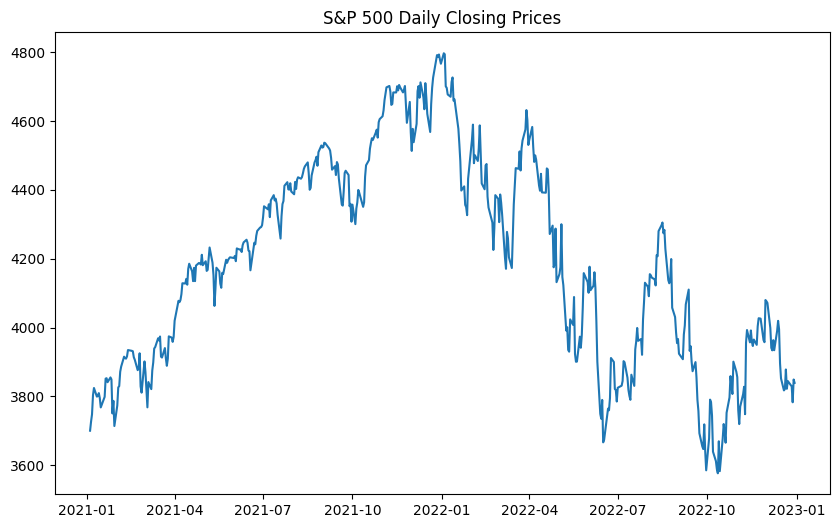

In [37]:
# Check for Outliers

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(df_SP500_clean['SP500_Price'])
plt.title("S&P 500 Daily Closing Prices")
plt.show()

In [62]:
# Filter the relevant time period - the relevant time frame for Crypto Winter (e.g., 2021-2022):
# crypto_winter = df_SP500[(df_SP500.index >= '2021-01-01') & (df_SP500.index <= '2022-12-31')]

In [38]:
# Calculate percentage change for S&P 500
df_SP500_clean["SP500_pct_change"] = df_SP500_clean["SP500_Price"].pct_change() * 100

In [39]:
print(df_SP500_clean.head())

            SP500_Price  SP500_pct_change
Date                                     
2021-01-04      3700.65               NaN
2021-01-05      3726.86          0.708254
2021-01-06      3748.14          0.570990
2021-01-07      3803.79          1.484736
2021-01-08      3824.68          0.549189


In [7]:
# Gather Data for Gold (Gold ETF)

import yfinance as yf
import pandas as pd

try:
    # Fetch historical data for GLD (Gold ETF)
    gold_etf = yf.Ticker("GLD")
    data = gold_etf.history(start="2021-01-01", end="2022-12-31")

    data.index = data.index.tz_localize(None)

    data.to_excel("data/raw/Cryptocurrency/Gold_Prices_2021_2022.xlsx", engine='openpyxl')
    
except Exception:
    pass  # Silently ignore any error

In [13]:
df_Gold = pd.read_excel('data/raw/Cryptocurrency/Gold_Prices_2021-2022.xlsx')

In [14]:
df_Gold=df_Gold[['Date','Close']]

In [43]:
print((df_Gold).head(10))

        Date       Close
0 2021-01-04  182.330002
1 2021-01-05  182.869995
2 2021-01-06  179.899994
3 2021-01-07  179.479996
4 2021-01-08  173.339996
5 2021-01-11  173.000000
6 2021-01-12  174.119995
7 2021-01-13  173.369995
8 2021-01-14  173.279999
9 2021-01-15  171.130005


In [15]:
# Rename columns in this DataFrame
df_Gold = df_Gold.copy()  
df_Gold.rename(columns={"Close": "Gold_Price"}, inplace=True)

In [45]:
print(df_Gold.head())

        Date  Gold_Price
0 2021-01-04  182.330002
1 2021-01-05  182.869995
2 2021-01-06  179.899994
3 2021-01-07  179.479996
4 2021-01-08  173.339996


In [46]:
# Check for missing values
print(df_Gold.isnull().sum())

Date          0
Gold_Price    0
dtype: int64


In [16]:
# Set the Date column as the Index
df_Gold.set_index('Date', inplace=True)

In [48]:
print(df_Gold.shape)

(503, 1)


In [49]:
df_Gold.to_excel("data/raw/Cryptocurrency/Gold_Prices.xlsx", engine='openpyxl')

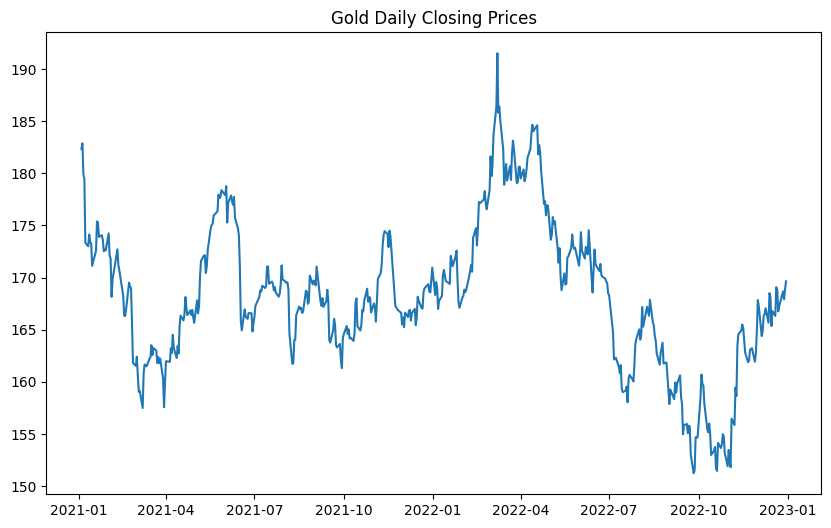

In [50]:
# Check for Outliers

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(df_Gold['Gold_Price'])
plt.title("Gold Daily Closing Prices")
plt.show()

In [51]:
# Calculate percentage change for Gold
df_Gold["Gold_pct_change"] = df_Gold["Gold_Price"].pct_change() * 100

In [52]:
print(df_Gold.head())

            Gold_Price  Gold_pct_change
Date                                   
2021-01-04  182.330002              NaN
2021-01-05  182.869995         0.296163
2021-01-06  179.899994        -1.624105
2021-01-07  179.479996        -0.233462
2021-01-08  173.339996        -3.420994


In [17]:
# 5.C. Prepare Data for Bitcoin

df = pd.read_excel('data/raw/Cryptocurrency/Fixed_Cryptocurrency_Prices.xlsx')

In [18]:
bitcoin_data=df[['Date','Bitcoin_price']]

In [55]:
print((bitcoin_data).head())

        Date  Bitcoin_price
0 2020-01-01        7200.85
1 2020-01-02        6965.71
2 2020-01-03        7344.96
3 2020-01-04        7354.11
4 2020-01-05        7358.75


In [19]:
# Make a copy of the DataFrame if it's a slice
bitcoin_data = bitcoin_data.copy()

bitcoin_data['Date'] = pd.to_datetime(bitcoin_data['Date'])

# Set the 'Date' column as the index
bitcoin_data.set_index('Date', inplace=True)

In [20]:
# Filter the data for the years 2021 and 2022
bitcoin_data_2021_2022 = bitcoin_data[bitcoin_data.index.year.isin([2021, 2022])]

In [21]:
import pandas as pd

# Define a list of dates when the markets were closed (e.g., holidays)
market_closed_dates = pd.to_datetime([
    "2021-01-18", "2021-02-15", "2021-04-02", "2021-05-31", "2021-07-05",
    "2021-09-06", "2021-11-25", "2021-12-24", "2022-01-17", "2022-02-21", 
    "2022-04-15", "2022-05-30", "2022-06-20", "2022-07-04", "2022-09-05",
    "2022-11-24", "2022-12-26", "2021-01-01"
])

# Filter out weekends (Saturday=5, Sunday=6)
bitcoin_data_weekdays = bitcoin_data_2021_2022[~bitcoin_data_2021_2022.index.weekday.isin([5, 6])]

# Filter out the rows for market holidays
filtered_bitcoin_data = bitcoin_data_weekdays[~bitcoin_data_weekdays.index.isin(market_closed_dates)]

print("Filtered Bitcoin data:")
print((filtered_bitcoin_data).head())

Filtered Bitcoin data:
            Bitcoin_price
Date                     
2021-01-04       31988.71
2021-01-05       33949.53
2021-01-06       36769.36
2021-01-07       39432.28
2021-01-08       40582.81


In [59]:
print(filtered_bitcoin_data.shape)

(503, 1)


In [60]:
filtered_bitcoin_data.to_excel("data/raw/Cryptocurrency/Filtered_Bitcoin_Prices.xlsx", engine='openpyxl')

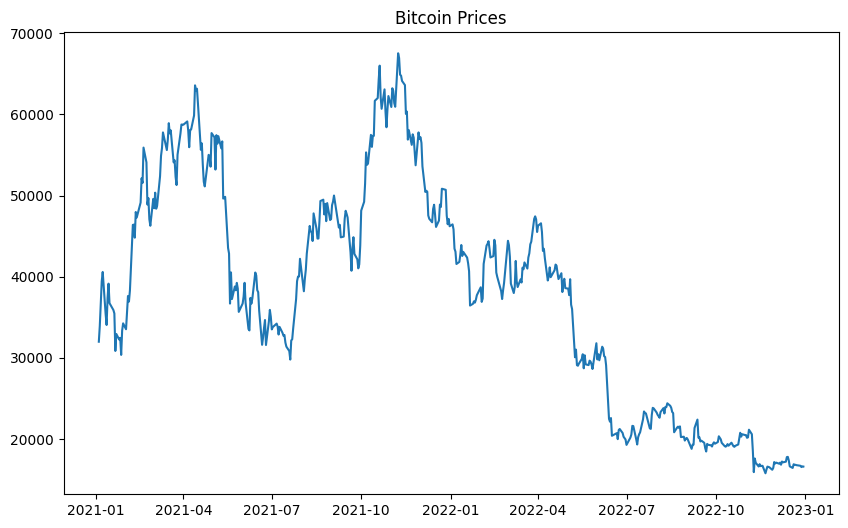

In [61]:
# Check for Outliers

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(filtered_bitcoin_data['Bitcoin_price'])
plt.title("Bitcoin Prices")
plt.show()

In [22]:
# Make a copy of the filtered Bitcoin data
filtered_bitcoin_data = filtered_bitcoin_data.copy()

# Calculate percentage change for Bitcoin
filtered_bitcoin_data["Bitcoin_pct_change"] = filtered_bitcoin_data["Bitcoin_price"].pct_change() * 100

In [63]:
print(filtered_bitcoin_data.head())

            Bitcoin_price  Bitcoin_pct_change
Date                                         
2021-01-04       31988.71                 NaN
2021-01-05       33949.53            6.129725
2021-01-06       36769.36            8.305947
2021-01-07       39432.28            7.242226
2021-01-08       40582.81            2.917736


In [23]:
# 5.D. Merge data for S&P 500, Gold and Bitcoin

# Merge DataFrames on Date
merged_data = pd.merge(filtered_bitcoin_data, df_SP500_clean, on='Date', how='inner')
merged_data = pd.merge(merged_data, df_Gold, on='Date', how='inner')

In [24]:
# Add percentage change columns
merged_data['Bitcoin_pct_change'] = merged_data['Bitcoin_price'].pct_change()
merged_data['SP500_pct_change'] = merged_data['SP500_Price'].pct_change()
merged_data['Gold_pct_change'] = merged_data['Gold_Price'].pct_change()

In [66]:
# Handle missing values
merged_data.ffill(inplace=True)

In [67]:
merged_data.to_excel('data/raw/Cryptocurrency/merged_data.xlsx', engine='openpyxl')

In [68]:
print(merged_data.head())

            Bitcoin_price  Bitcoin_pct_change  SP500_Price  SP500_pct_change  \
Date                                                                           
2021-01-04       31988.71                 NaN      3700.65               NaN   
2021-01-05       33949.53            0.061297      3726.86          0.007083   
2021-01-06       36769.36            0.083059      3748.14          0.005710   
2021-01-07       39432.28            0.072422      3803.79          0.014847   
2021-01-08       40582.81            0.029177      3824.68          0.005492   

            Gold_Price  Gold_pct_change  
Date                                     
2021-01-04  182.330002              NaN  
2021-01-05  182.869995         0.002962  
2021-01-06  179.899994        -0.016241  
2021-01-07  179.479996        -0.002335  
2021-01-08  173.339996        -0.034210  


In [69]:
# Check for missing values
print(merged_data.isnull().sum())

Bitcoin_price         0
Bitcoin_pct_change    1
SP500_Price           0
SP500_pct_change      1
Gold_Price            0
Gold_pct_change       1
dtype: int64


In [25]:
# Drop rows with missing percentage change (optional)
merged_data=merged_data.dropna()

In [26]:
# Check for missing values
print(merged_data.isnull().sum())

Bitcoin_price         0
Bitcoin_pct_change    0
SP500_Price           0
Gold_Price            0
SP500_pct_change      0
Gold_pct_change       0
dtype: int64


In [72]:
# 5.E. Compare the volatility of cryptocurrencies with traditional assets

btc_volatility = merged_data['Bitcoin_pct_change'].std()
sp500_volatility = merged_data['SP500_pct_change'].std()
gold_volatility = merged_data['Gold_pct_change'].std()

print("Bitcoin Volatility:")
print(btc_volatility)

print("S&P 500 Volatility:")
print(sp500_volatility)

print("Gold Volatility:")
print(gold_volatility)

Bitcoin Volatility:
0.04509334535155401
S&P 500 Volatility:
0.012252646807802931
Gold Volatility:
0.009080854827447723


In [ ]:
# 5.F. Broad Comparison: January 2021 – October 2021 vs. November 2021 – December 2022.

In [28]:
# Assign Periods for Broad Comparison

def assign_period(date):
    if date < pd.Timestamp('2021-11-01'):
        return 'Jan 2021 - Oct 2021'
    elif date <= pd.Timestamp('2022-12-31'):  # Ensures full coverage
        return 'Nov 2021 - Dec 2022'
    else:
        return None  # Catch unexpected cases

merged_data.index = pd.to_datetime(merged_data.index)

# Assign periods
merged_data["Period"] = merged_data.index.map(assign_period)

print(merged_data["Period"].value_counts())

Period
Nov 2021 - Dec 2022    294
Jan 2021 - Oct 2021    208
Name: count, dtype: int64


In [103]:
print(merged_data.reset_index()[['Date', 'Period']].drop_duplicates().head(500))

          Date               Period
0   2021-01-05  Jan 2021 - Oct 2021
1   2021-01-06  Jan 2021 - Oct 2021
2   2021-01-07  Jan 2021 - Oct 2021
3   2021-01-08  Jan 2021 - Oct 2021
4   2021-01-11  Jan 2021 - Oct 2021
..         ...                  ...
495 2022-12-21  Nov 2021 - Dec 2022
496 2022-12-22  Nov 2021 - Dec 2022
497 2022-12-23  Nov 2021 - Dec 2022
498 2022-12-27  Nov 2021 - Dec 2022
499 2022-12-28  Nov 2021 - Dec 2022

[500 rows x 2 columns]


In [29]:
# Compare the volatility (Standard Deviation of Daily % Changes) of cryptocurrencies with traditional assets in two periods: 
# January 2021 – October 2021 vs. November 2021 – December 2022

# Define the two periods
pre_crash = merged_data[(merged_data.index >= '2021-01-01') & (merged_data.index <= '2021-10-31')]
post_crash = merged_data[(merged_data.index >= '2021-11-01') & (merged_data.index <= '2022-12-31')]

# Calculate volatilities for Pre-Crash period
btc_volatility_pre = pre_crash['Bitcoin_pct_change'].std()
sp500_volatility_pre = pre_crash['SP500_pct_change'].std()
gold_volatility_pre = pre_crash['Gold_pct_change'].std()

# Calculate volatilities for Post-Crash period
btc_volatility_post = post_crash['Bitcoin_pct_change'].std()
sp500_volatility_post = post_crash['SP500_pct_change'].std()
gold_volatility_post = post_crash['Gold_pct_change'].std()

print("Volatility Comparison (Standard Deviation of Daily % Changes):")
print(f"{'Asset':<10}{'Pre-Crash':<15}{'Post-Crash':<15}")
print(f"{'Bitcoin':<10}{btc_volatility_pre:<15.4f}{btc_volatility_post:<15.4f}")
print(f"{'S&P 500':<10}{sp500_volatility_pre:<15.4f}{sp500_volatility_post:<15.4f}")
print(f"{'Gold':<10}{gold_volatility_pre:<15.4f}{gold_volatility_post:<15.4f}")

Volatility Comparison (Standard Deviation of Daily % Changes):
Asset     Pre-Crash      Post-Crash     
Bitcoin   0.0517         0.0395         
S&P 500   0.0079         0.0145         
Gold      0.0088         0.0093         


In [ ]:
# Let's visualize the daily percentage changes in the prices of Bitcoin, S&P 500 and Gold along with the distribution of these changes. 
# We will use a distplot and an interactive histogram in Plotly 

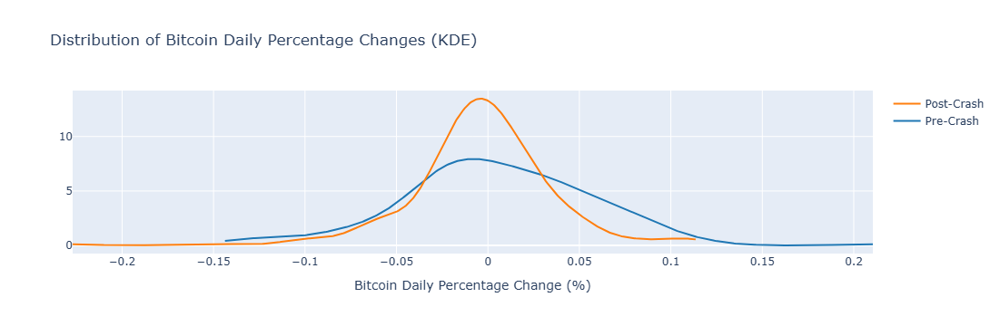

In [90]:
import plotly.figure_factory as ff

# Create a density plot (KDE)
fig = ff.create_distplot(
    [pre_crash['Bitcoin_pct_change'], post_crash['Bitcoin_pct_change']],
    group_labels=['Pre-Crash', 'Post-Crash'],
    show_hist=False,  
    show_rug=False
)

fig.update_layout(
    title='Distribution of Bitcoin Daily Percentage Changes (KDE)',
    xaxis_title='Bitcoin Daily Percentage Change (%)'
)

fig.show()

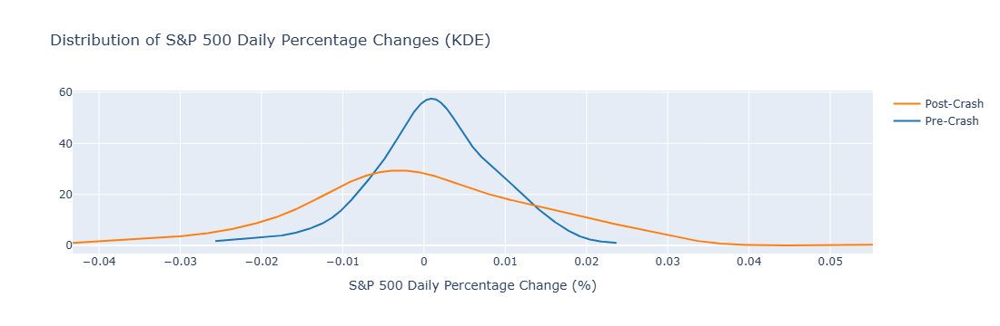

In [30]:
import plotly.figure_factory as ff

# Create a density plot (KDE)
fig = ff.create_distplot(
    [pre_crash['SP500_pct_change'], post_crash['SP500_pct_change']],
    group_labels=['Pre-Crash', 'Post-Crash'],
    show_hist=False,  
    show_rug=False
)

fig.update_layout(
    title='Distribution of S&P 500 Daily Percentage Changes (KDE)',
    xaxis_title='S&P 500 Daily Percentage Change (%)'
)

fig.show()

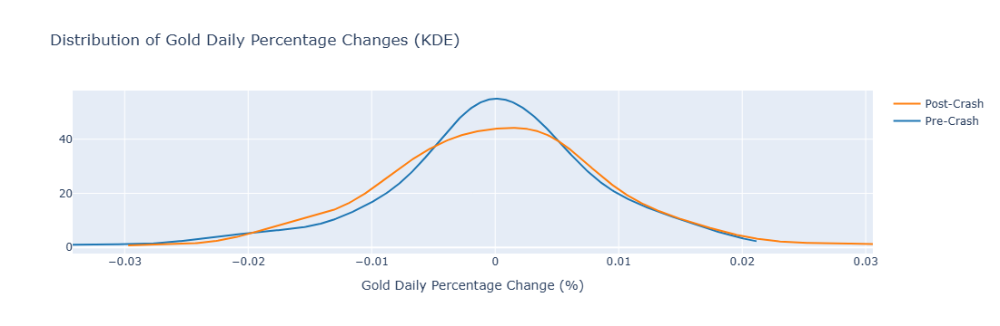

In [31]:
import plotly.figure_factory as ff

# Create a density plot (KDE)
fig = ff.create_distplot(
    [pre_crash['Gold_pct_change'], post_crash['Gold_pct_change']],
    group_labels=['Pre-Crash', 'Post-Crash'],
    show_hist=False,  
    show_rug=False
)

fig.update_layout(
    title='Distribution of Gold Daily Percentage Changes (KDE)',
    xaxis_title='Gold Daily Percentage Change (%)'
)

fig.show()

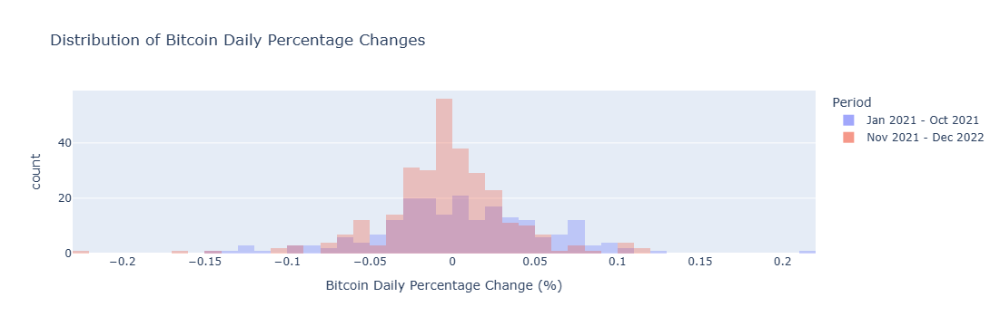

In [89]:
import plotly.express as px

fig = px.histogram(
    merged_data,
    x='Bitcoin_pct_change',
    color='Period',
    nbins=50,
    title='Distribution of Bitcoin Daily Percentage Changes',
    labels={'Bitcoin_pct_change': 'Bitcoin Daily Percentage Change (%)'},
    barmode='overlay',  
    template='plotly'
)
fig.update_traces(opacity=0.6)  # Adjust transparency for clarity
fig.show()

In [ ]:
# Let's add an interactive 2D line plot

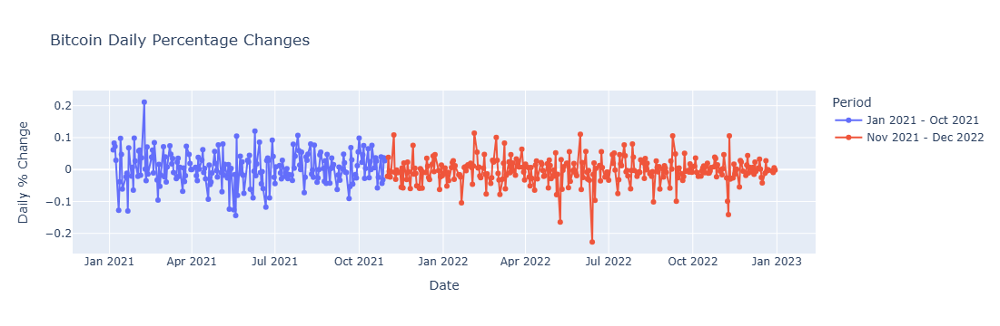

In [120]:
import plotly.express as px

# Ensure 'Date' is a column (not index)
df_plot = merged_data.reset_index()

# Create the line plot
fig = px.line(
    df_plot,
    x='Date',
    y='Bitcoin_pct_change',  
    color='Period',  
    title='Bitcoin Daily Percentage Changes',
    labels={'Bitcoin_pct_change': 'Daily % Change'}
)

fig.update_traces(mode='lines+markers')
fig.show()

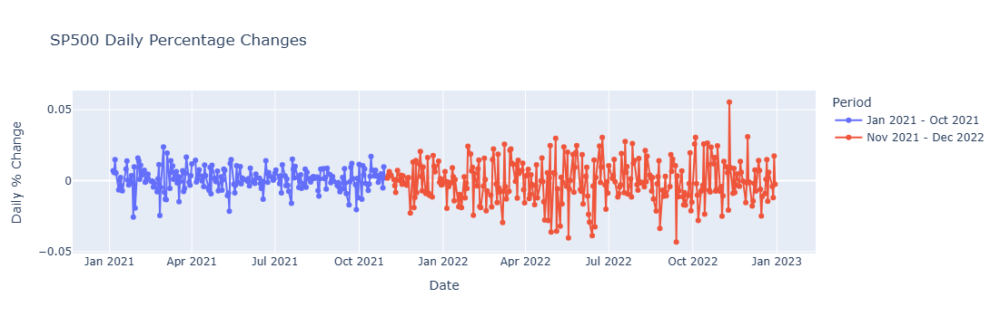

In [121]:
import plotly.express as px

# Ensure 'Date' is a column (not index)
df_plot = merged_data.reset_index()

# Create the line plot
fig = px.line(
    df_plot,
    x='Date',
    y='SP500_pct_change',  
    color='Period',  
    title='SP500 Daily Percentage Changes',
    labels={'SP500_pct_change': 'Daily % Change'}
)

fig.update_traces(mode='lines+markers')
fig.show()

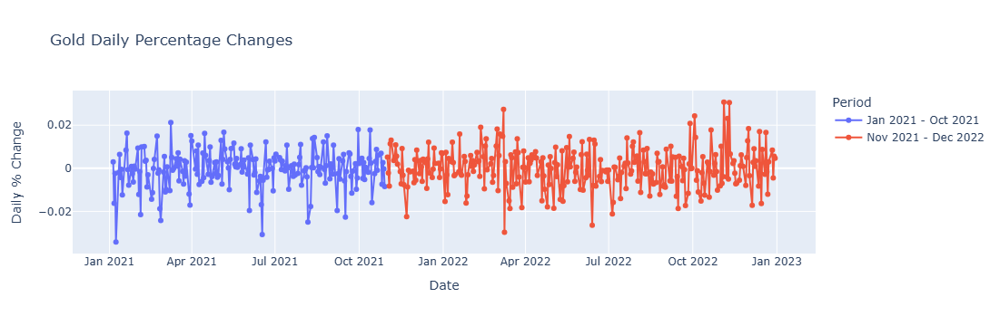

In [122]:
import plotly.express as px

# Ensure 'Date' is a column (not index)
df_plot = merged_data.reset_index()

# Create the line plot
fig = px.line(
    df_plot,
    x='Date',
    y='Gold_pct_change',  
    color='Period',  
    title='Gold Daily Percentage Changes',
    labels={'Gold_pct_change': 'Daily % Change'}
)

fig.update_traces(mode='lines+markers')
fig.show()

In [ ]:
# 5.G. Focused Analysis of the Crash: November 2021 – April 2022 vs. May 2022 – October 2022.

In [33]:
# Assign Periods for Focused Crash Analysis

def assign_focused_period(date):
    if pd.Timestamp('2021-11-01') <= date <= pd.Timestamp('2022-04-30'):
        return 'Nov 2021 - Apr 2022'
    elif pd.Timestamp('2022-05-01') <= date <= pd.Timestamp('2022-10-31'):
        return 'May 2022 - Oct 2022'
    else:
        return 'Outside Focused Period'  # Use this instead of None for debugging

merged_data["Focused_Period"] = merged_data.index.map(assign_focused_period)

In [34]:
print(merged_data["Focused_Period"].value_counts())  # Counts per period
print(merged_data.reset_index()[['Date', 'Focused_Period']].drop_duplicates().head(250))  

Focused_Period
Outside Focused Period    250
May 2022 - Oct 2022       127
Nov 2021 - Apr 2022       125
Name: count, dtype: int64
          Date          Focused_Period
0   2021-01-05  Outside Focused Period
1   2021-01-06  Outside Focused Period
2   2021-01-07  Outside Focused Period
3   2021-01-08  Outside Focused Period
4   2021-01-11  Outside Focused Period
..         ...                     ...
245 2021-12-23     Nov 2021 - Apr 2022
246 2021-12-27     Nov 2021 - Apr 2022
247 2021-12-28     Nov 2021 - Apr 2022
248 2021-12-29     Nov 2021 - Apr 2022
249 2021-12-30     Nov 2021 - Apr 2022

[250 rows x 2 columns]


In [35]:
# Compare the volatility of cryptocurrencies with traditional assets in two periods: November 2021 – April 2022 vs. May 2022 – October 2022

# Define the two periods
pre_may_crash = merged_data[(merged_data.index >= '2021-11-01') & (merged_data.index <= '2022-04-30')]
post_may_crash = merged_data[(merged_data.index >= '2022-05-01') & (merged_data.index <= '2022-10-31')]

# Calculate volatilities for the first period (Pre-May 2022 Crash)
btc_volatility_pre = pre_may_crash['Bitcoin_pct_change'].std()
sp500_volatility_pre = pre_may_crash['SP500_pct_change'].std()
gold_volatility_pre = pre_may_crash['Gold_pct_change'].std()

# Calculate volatilities for the second period (Post-May 2022 Crash)
btc_volatility_post = post_may_crash['Bitcoin_pct_change'].std()
sp500_volatility_post = post_may_crash['SP500_pct_change'].std()
gold_volatility_post = post_may_crash['Gold_pct_change'].std()

print("Volatility Comparison (Standard Deviation of Daily % Changes):")
print(f"{'Asset':<10}{'Pre-May 2022 Crash':<25}{'Post-May 2022 Crash':<25}")
print(f"{'Bitcoin':<10}{btc_volatility_pre:<25.4f}{btc_volatility_post:<25.4f}")
print(f"{'S&P 500':<10}{sp500_volatility_pre:<25.4f}{sp500_volatility_post:<25.4f}")
print(f"{'Gold':<10}{gold_volatility_pre:<25.4f}{gold_volatility_post:<25.4f}")

Volatility Comparison (Standard Deviation of Daily % Changes):
Asset     Pre-May 2022 Crash       Post-May 2022 Crash      
Bitcoin   0.0363                   0.0432                   
S&P 500   0.0127                   0.0162                   
Gold      0.0089                   0.0090                   


In [ ]:
# Let's visualize the daily percentage changes in the prices of Bitcoin along with the distribution of these changes. 
# We will use a distplot and an interactive histogram in Plotly 

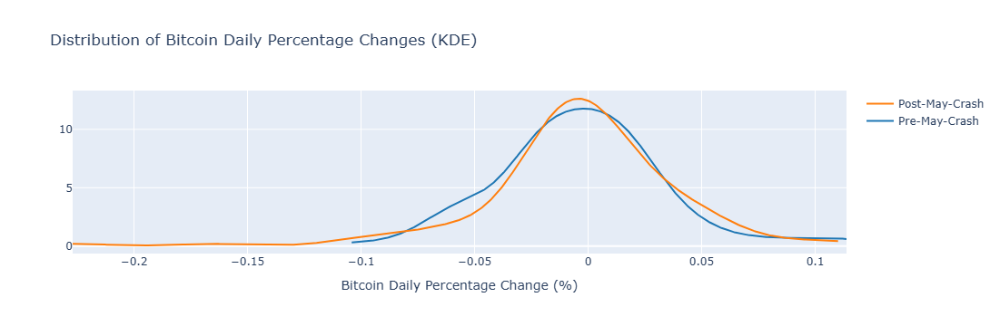

In [36]:
import plotly.figure_factory as ff

# Create a density plot (KDE)
fig = ff.create_distplot(
    [pre_may_crash['Bitcoin_pct_change'], post_may_crash['Bitcoin_pct_change']],
    group_labels=['Pre-May-Crash', 'Post-May-Crash'],
    show_hist=False, 
    show_rug=False
)

fig.update_layout(
    title='Distribution of Bitcoin Daily Percentage Changes (KDE)',
    xaxis_title='Bitcoin Daily Percentage Change (%)'
)

fig.show()

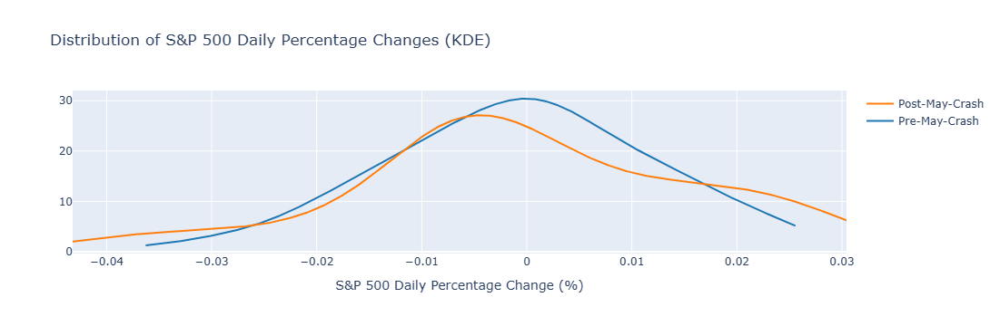

In [37]:
import plotly.figure_factory as ff

# Create a density plot (KDE)
fig = ff.create_distplot(
    [pre_may_crash['SP500_pct_change'], post_may_crash['SP500_pct_change']],
    group_labels=['Pre-May-Crash', 'Post-May-Crash'],
    show_hist=False,  
    show_rug=False
)

fig.update_layout(
    title='Distribution of S&P 500 Daily Percentage Changes (KDE)',
    xaxis_title='S&P 500 Daily Percentage Change (%)'
)

fig.show()

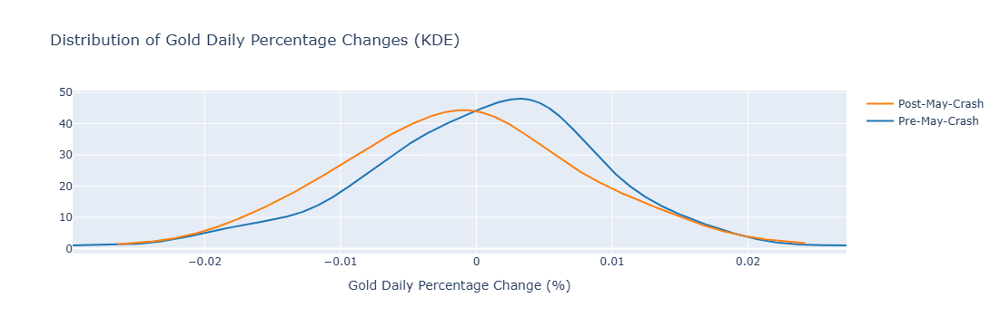

In [38]:
import plotly.figure_factory as ff

# Create a density plot (KDE)
fig = ff.create_distplot(
    [pre_may_crash['Gold_pct_change'], post_may_crash['Gold_pct_change']],
    group_labels=['Pre-May-Crash', 'Post-May-Crash'],
    show_hist=False,  
    show_rug=False
)

fig.update_layout(
    title='Distribution of Gold Daily Percentage Changes (KDE)',
    xaxis_title='Gold Daily Percentage Change (%)'
)

fig.show()

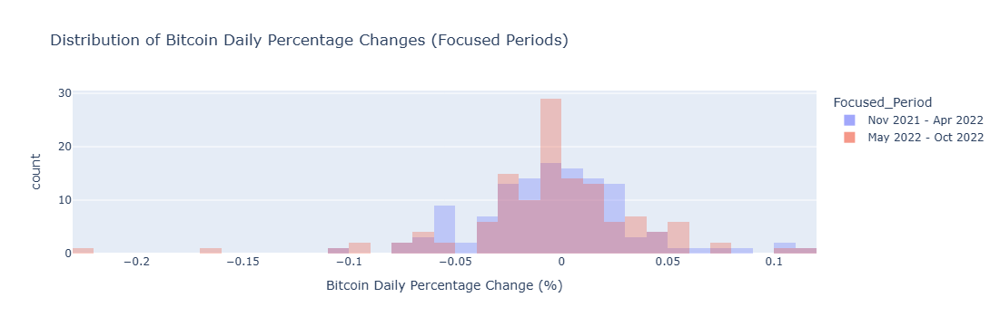

In [140]:
# Filter data to include only the focused periods
filtered_data = merged_data[merged_data['Focused_Period'].isin(["Nov 2021 - Apr 2022", "May 2022 - Oct 2022"])]

# Create histogram
fig = px.histogram(
    filtered_data,  # Use filtered dataset
    x='Bitcoin_pct_change',
    color='Focused_Period',
    nbins=50,
    title='Distribution of Bitcoin Daily Percentage Changes (Focused Periods)',
    labels={'Bitcoin_pct_change': 'Bitcoin Daily Percentage Change (%)'},
    barmode='overlay',  
    template='plotly'
)

fig.update_traces(opacity=0.6)  
fig.show()

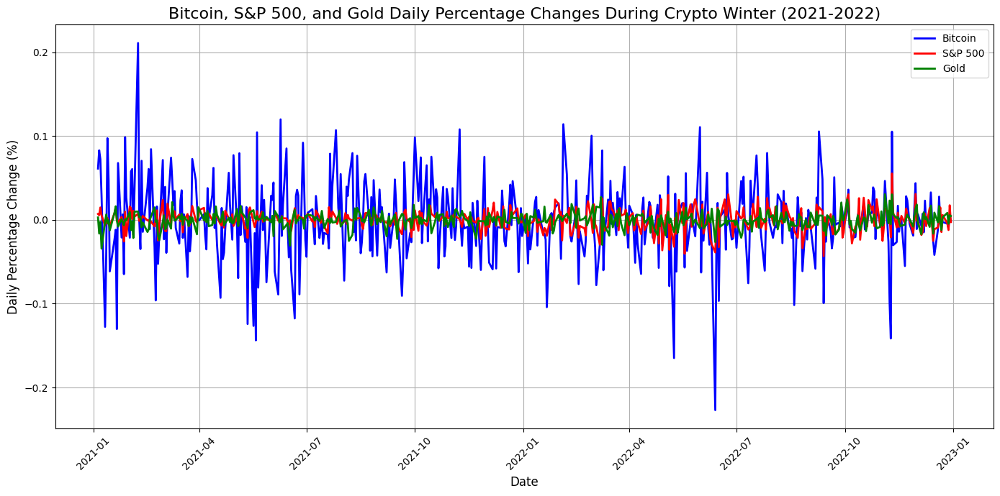

In [132]:
# Let's add a line plot for Bitcoin, S&P 500, and Gold daily percentage changes during the Crypto Winter 
# to complement the volatility comparison

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(14, 7))

plt.plot(merged_data.index, merged_data['Bitcoin_pct_change'], label="Bitcoin", color='blue', linewidth=2)
plt.plot(merged_data.index, merged_data['SP500_pct_change'], label="S&P 500", color='red', linewidth=2)
plt.plot(merged_data.index, merged_data['Gold_pct_change'], label="Gold", color='green', linewidth=2)

plt.title('Bitcoin, S&P 500, and Gold Daily Percentage Changes During Crypto Winter (2021-2022)', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Daily Percentage Change (%)', fontsize=12)
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# Conclusions:

# After the broader crash (Nov 2021 – Dec 2022), Bitcoin volatility declined.
# After the May 2022 crash, Bitcoin volatility actually increased, possibly reflecting short-term panic or uncertainty.
# This highlights a nuanced picture: Bitcoin didn't simply “calm down” after 2022 — it initially experienced more volatility post-crash (May–Oct), 
# then stabilized in the longer-term view. Volatility is time-frame sensitive. While the long-term trend for Bitcoin showed stabilization, 
# the short-term impact of the May 2022 crash temporarily reignited volatility. Any analysis of market behavior post-crash must account 
# for these layered dynamics.

# Both the S&P 500 and Gold show relatively stable fluctuations before the crash.
# After the crash, their daily percentage changes appear to have larger swings, indicating increased volatility.

# The differing volatility patterns of Bitcoin, the S&P 500, and Gold after a crash can be attributed to their distinct roles in the financial 
# ecosystem and investor behavior:

# -Bitcoin's market is highly speculative, and after the crash, many retail investors exited, reducing extreme price swings. Additionally, 
# the market may enter a consolidation phase as participants wait for clearer signals before making moves.
# -S&P 500: A crash often triggers heightened uncertainty in the stock market. Investors react to macroeconomic factors, corporate earnings, 
# and policy changes, leading to increased trading activity and price swings.
# -Gold, as a traditional safe-haven asset, attracts investors during times of financial turmoil. This surge in demand, 
# coupled with fluctuating market sentiment, can amplify its price volatility.

In [ ]:
# 5.H. Correlation Analysis between cryptocurrencies and traditional markets before and during the Crypto Winter (Broad and focused comparison)

In [141]:
# Compute the correlation between cryptocurrencies and traditional markets Jan 2021 – Oct 2021 vs. Nov 2021 – Dec 2022.

correlation_pre = pre_crash[['Bitcoin_pct_change', 'SP500_pct_change', 'Gold_pct_change']].corr()
correlation_post = post_crash[['Bitcoin_pct_change', 'SP500_pct_change', 'Gold_pct_change']].corr()

print("Pre-Crash Correlation:")
print(correlation_pre)

print("\nPost-Crash Correlation:")
print(correlation_post)

Pre-Crash Correlation:
                    Bitcoin_pct_change  SP500_pct_change  Gold_pct_change
Bitcoin_pct_change            1.000000          0.275641        -0.045718
SP500_pct_change              0.275641          1.000000         0.219221
Gold_pct_change              -0.045718          0.219221         1.000000

Post-Crash Correlation:
                    Bitcoin_pct_change  SP500_pct_change  Gold_pct_change
Bitcoin_pct_change            1.000000          0.533406         0.133132
SP500_pct_change              0.533406          1.000000         0.188741
Gold_pct_change               0.133132          0.188741         1.000000


In [ ]:
# Bitcoin and S&P 500:
# Pre-Crash Correlation: 0.28 (weak positive correlation). Post-Crash Correlation: 0.53 (moderate positive correlation)
# This suggests that Bitcoin and the S&P 500 became more closely aligned after the crash. It reflects how Bitcoin, 
# often seen as a speculative asset, began behaving more like equities during times of economic stress, losing its independence.

# Bitcoin and Gold:
# Pre-Crash Correlation: -0.05 (no correlation). Post-Crash Correlation: 0.13 (weak positive correlation)
# Bitcoin and Gold showed slightly more alignment post-crash, potentially indicating a temporary shared reaction to global uncertainty, 
# though their relationship remained weak.

# Gold and S&P 500:
# Pre-Crash Correlation: 0.22 (weak positive correlation). Post-Crash Correlation: 0.19 (weak positive correlation)
# Gold’s relationship with the S&P 500 remained weak throughout, reaffirming its role as a safe-haven asset that moves largely independently of equities.

In [142]:
# Compute the correlation between cryptocurrencies and traditional markets November 2021 – April 2022 vs. May 2022 – October 2022.

correlation_pre = pre_may_crash[['Bitcoin_pct_change', 'SP500_pct_change', 'Gold_pct_change']].corr()
correlation_post = post_may_crash[['Bitcoin_pct_change', 'SP500_pct_change', 'Gold_pct_change']].corr()

print("Pre-May-Crash Correlation:")
print(correlation_pre)

print("\nPost-May-Crash Correlation:")
print(correlation_post)

Pre-May-Crash Correlation:
                    Bitcoin_pct_change  SP500_pct_change  Gold_pct_change
Bitcoin_pct_change            1.000000          0.463228        -0.129844
SP500_pct_change              0.463228          1.000000        -0.203777
Gold_pct_change              -0.129844         -0.203777         1.000000

Post-May-Crash Correlation:
                    Bitcoin_pct_change  SP500_pct_change  Gold_pct_change
Bitcoin_pct_change            1.000000          0.565824         0.281765
SP500_pct_change              0.565824          1.000000         0.343131
Gold_pct_change               0.281765          0.343131         1.000000


In [ ]:
# Bitcoin and S&P 500:
# Pre-Crash Correlation: 0.46 (moderate positive correlation). Post-Crash Correlation: 0.57 (moderate-to-strong positive correlation)
# This suggests that Bitcoin and the S&P 500 became more correlated after the crash. The increase in correlation reflects how Bitcoin, 
# traditionally viewed as an independent asset, increasingly moved in sync with equities, possibly due to macroeconomic uncertainty 
# and risk-off sentiment in financial markets.

# Bitcoin and Gold:
# Pre-Crash Correlation: -0.13 (weak negative correlation). Post-Crash Correlation: 0.28 (weak-to-moderate positive correlation)
# Bitcoin and Gold had a weak negative relationship before the crash, meaning they often moved in opposite directions. 
# However, after the crash, their correlation turned positive, suggesting that Bitcoin may have started to show some characteristics 
# of a safe-haven asset, albeit to a limited extent.

# Gold and S&P 500:
# Pre-Crash Correlation: -0.20 (weak negative correlation). Post-Crash Correlation: 0.34 (weak-to-moderate positive correlation)
# Before the crash, Gold and the S&P 500 were slightly negatively correlated, consistent with Gold's traditional role as a hedge against 
# stock market declines. However, after the crash, their correlation turned weakly positive, which could indicate that investors treated both assets 
# similarly during economic turbulence, reducing Gold’s traditional role as a risk-off asset.

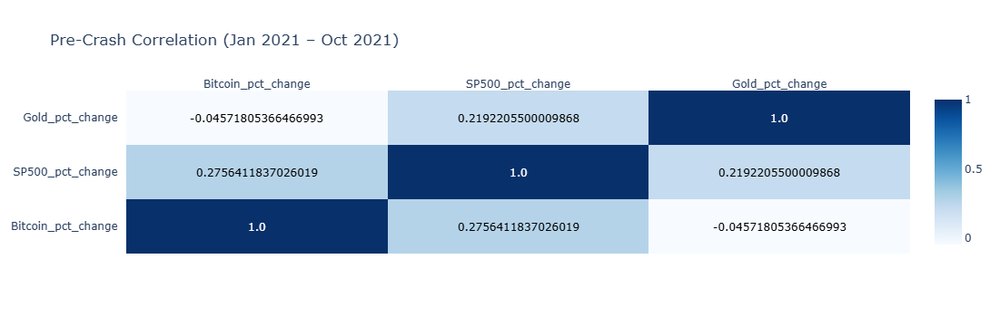

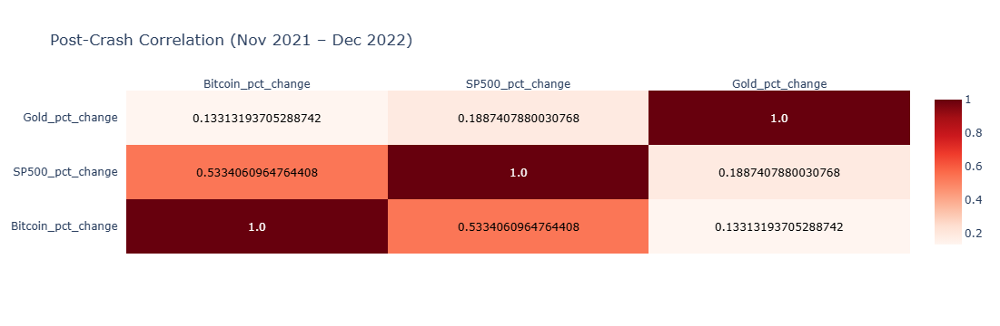

In [144]:
import plotly.figure_factory as ff

# Define correlation matrices
correlation_pre_crash = pre_crash[['Bitcoin_pct_change', 'SP500_pct_change', 'Gold_pct_change']].corr()
correlation_post_crash = post_crash[['Bitcoin_pct_change', 'SP500_pct_change', 'Gold_pct_change']].corr()

# Convert to list format for Plotly
z_pre_crash = correlation_pre_crash.values
z_post_crash = correlation_post_crash.values
labels = correlation_pre_crash.columns.tolist()

# Create heatmap figure
fig = ff.create_annotated_heatmap(
    z=z_pre_crash,
    x=labels,
    y=labels,
    colorscale='Blues',
    showscale=True
)
fig.update_layout(title="Pre-Crash Correlation (Jan 2021 – Oct 2021)")

fig.show()

# Create second heatmap for post-crash period
fig2 = ff.create_annotated_heatmap(
    z=z_post_crash,
    x=labels,
    y=labels,
    colorscale='Reds',
    showscale=True
)
fig2.update_layout(title="Post-Crash Correlation (Nov 2021 – Dec 2022)")

fig2.show()

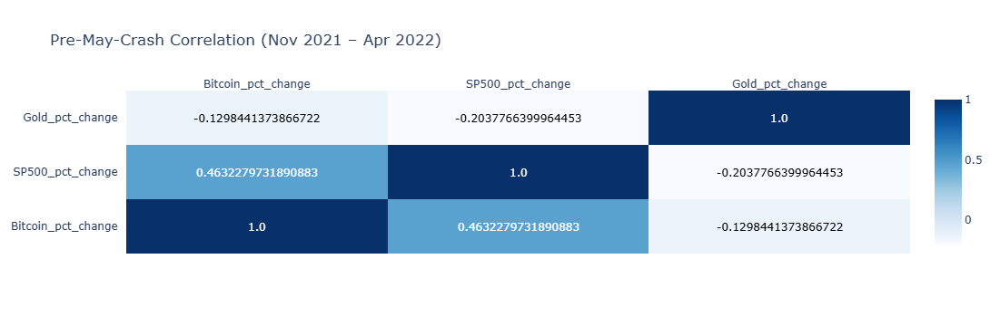

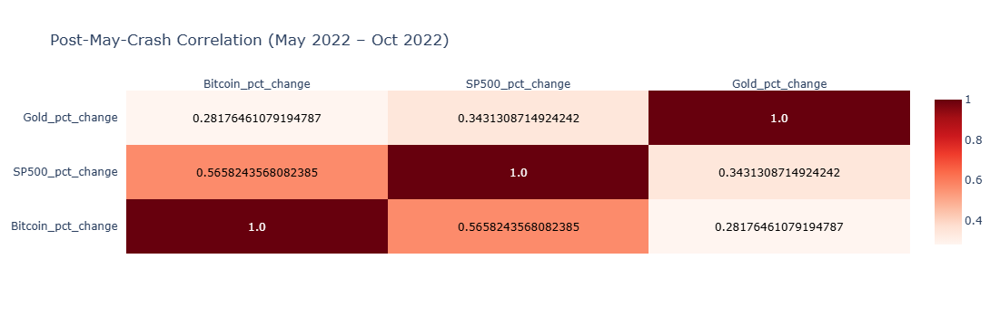

In [145]:
import plotly.figure_factory as ff

# Define correlation matrices
correlation_pre = pre_may_crash[['Bitcoin_pct_change', 'SP500_pct_change', 'Gold_pct_change']].corr()
correlation_post = post_may_crash[['Bitcoin_pct_change', 'SP500_pct_change', 'Gold_pct_change']].corr()

# Convert to list format for Plotly
z_pre = correlation_pre.values
z_post = correlation_post.values
labels = correlation_pre.columns.tolist()

# Create heatmap figure
fig = ff.create_annotated_heatmap(
    z=z_pre,
    x=labels,
    y=labels,
    colorscale='Blues',
    showscale=True
)
fig.update_layout(title="Pre-May-Crash Correlation (Nov 2021 – Apr 2022)")

fig.show()

# Create second heatmap for post-crash period
fig2 = ff.create_annotated_heatmap(
    z=z_post,
    x=labels,
    y=labels,
    colorscale='Reds',
    showscale=True
)
fig2.update_layout(title="Post-May-Crash Correlation (May 2022 – Oct 2022)")

fig2.show()

In [ ]:
# Across both long-term (Jan 2021 – Oct 2021 vs. Nov 2021 – Dec 2022) and focused (Nov 2021 – Apr 2022 vs. May 2022 – Oct 2022) analyses, 
# the following key trends emerge:

# - Bitcoin and S&P 500: Increased Correlation Over Time
# In both analyses, Bitcoin and the S&P 500 became more correlated after the crash.
# Early Periods: Before November 2021, Bitcoin had a weak-to-moderate correlation with the stock market, behaving somewhat independently.
# Later Periods: After the crash, Bitcoin's correlation with the S&P 500 increased significantly, suggesting that it moved more in line with 
# traditional equities, particularly during economic downturns. This supports the idea that Bitcoin, often seen as a decentralized alternative asset, 
# was increasingly traded as a high-risk investment similar to tech stocks.

# - Bitcoin and Gold: From Weak/Negative to Weak/Positive Correlation
# Before the crash, Bitcoin and Gold had little to no correlation (sometimes slightly negative).
# After the crash, their correlation turned weakly positive, indicating that in uncertain periods, Bitcoin may have started showing limited safe-haven 
# characteristics. However, the relationship remained weak, reinforcing that Bitcoin is still primarily a risk-on asset rather than a true alternative 
# to Gold.

# - Gold and S&P 500: More Positive Correlation Post-Crash
# Historically, Gold has been viewed as a hedge against stock market declines, which explains its slight negative or weak correlation with the S&P 500 
# in earlier periods.
# However, after the crash, Gold and the S&P 500 became more positively correlated, suggesting that macroeconomic factors (e.g., inflation fears, 
# monetary policy) impacted both assets in a similar way. This could indicate a temporary shift in Gold’s traditional role as a hedge.

In [ ]:
# 5.I. Visualisation. Using interactive scatter plot, 3D Scatter plot, Correlation Hitmap, Bubble Chart.

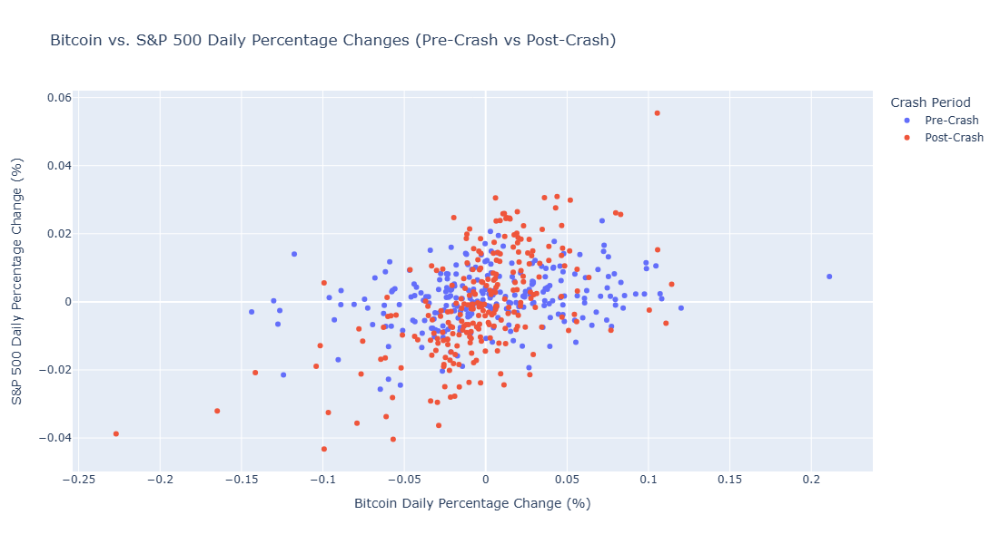

In [75]:
# Add a 'Period' column to both pre_crash and post_crash safely using .assign()
pre_crash = pre_crash.assign(Period='Pre-Crash')
post_crash = post_crash.assign(Period='Post-Crash')

# Combine the two DataFrames
combined_data = pd.concat([pre_crash, post_crash])

# Plotly scatter plot
import plotly.express as px
fig = px.scatter(
    combined_data,
    x='Bitcoin_pct_change',
    y='SP500_pct_change',
    color='Period',  
    labels={
        'Bitcoin_pct_change': 'Bitcoin Daily Percentage Change (%)',
        'SP500_pct_change': 'S&P 500 Daily Percentage Change (%)'
    },
    title='Bitcoin vs. S&P 500 Daily Percentage Changes (Pre-Crash vs Post-Crash)',
    template='plotly',
    hover_data=['Period']  
)

# Update layout for better visualization
fig.update_layout(
    legend_title_text='Crash Period',
    xaxis=dict(title='Bitcoin Daily Percentage Change (%)'),
    yaxis=dict(title='S&P 500 Daily Percentage Change (%)'),
    height=600,
    width=800
)

fig.show()

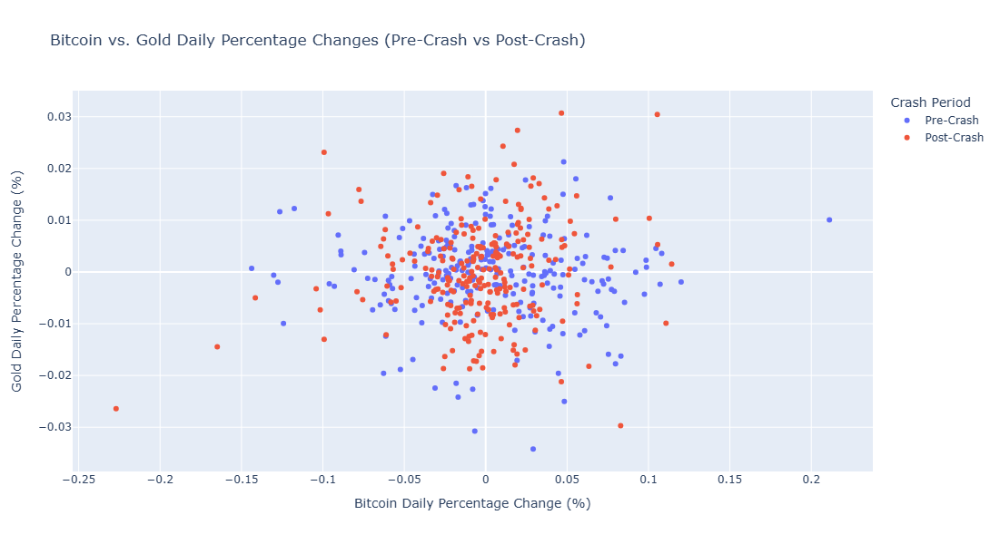

In [101]:
# Add a 'Period' column to both pre_crash and post_crash safely using .assign()
pre_crash = pre_crash.assign(Period='Pre-Crash')
post_crash = post_crash.assign(Period='Post-Crash')

# Combine the two DataFrames
combined_data = pd.concat([pre_crash, post_crash])

# Plotly scatter plot
import plotly.express as px
fig = px.scatter(
    combined_data,
    x='Bitcoin_pct_change',
    y='Gold_pct_change',
    color='Period',  
    labels={
        'Bitcoin_pct_change': 'Bitcoin Daily Percentage Change (%)',
        'Gold_pct_change': 'Gold Daily Percentage Change (%)'
    },
    title='Bitcoin vs. Gold Daily Percentage Changes (Pre-Crash vs Post-Crash)',
    template='plotly',
    hover_data=['Period']  
)

# Update layout for better visualization
fig.update_layout(
    legend_title_text='Crash Period',
    xaxis=dict(title='Bitcoin Daily Percentage Change (%)'),
    yaxis=dict(title='Gold Daily Percentage Change (%)'),
    height=600,
    width=800
)

fig.show()

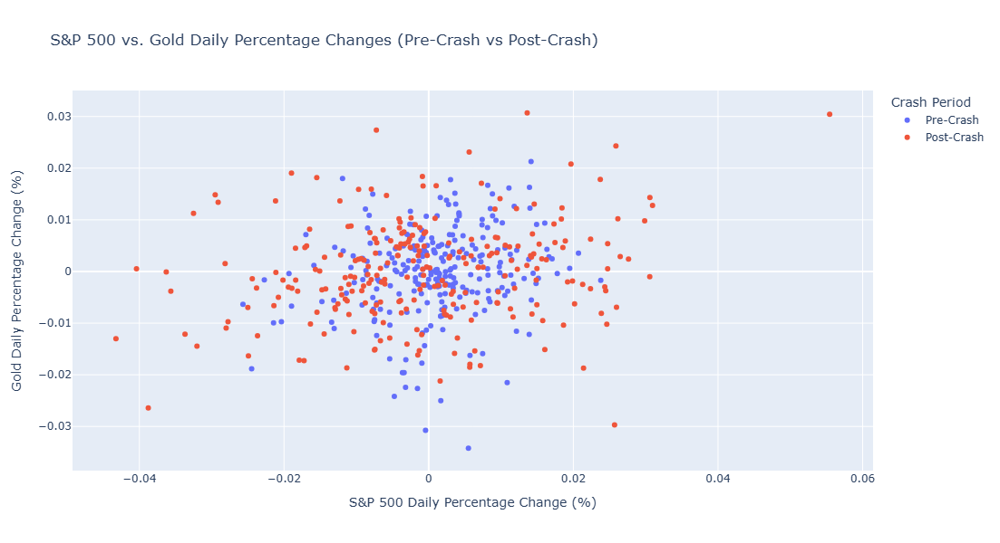

In [102]:
# Add a 'Period' column to both pre_crash and post_crash safely using .assign()
pre_crash = pre_crash.assign(Period='Pre-Crash')
post_crash = post_crash.assign(Period='Post-Crash')

# Combine the two DataFrames
combined_data = pd.concat([pre_crash, post_crash])

# Plotly scatter plot
import plotly.express as px
fig = px.scatter(
    combined_data,
    x='SP500_pct_change',
    y='Gold_pct_change',
    color='Period', 
    labels={
        'SP500_pct_change': 'S&P 500 Daily Percentage Change (%)',
        'Gold_pct_change': 'Gold Daily Percentage Change (%)'
    },
    title='S&P 500 vs. Gold Daily Percentage Changes (Pre-Crash vs Post-Crash)',
    template='plotly',
    hover_data=['Period'] 
)

# Update layout for better visualization
fig.update_layout(
    legend_title_text='Crash Period',
    xaxis=dict(title='S&P 500 Daily Percentage Change (%)'),
    yaxis=dict(title='Gold Daily Percentage Change (%)'),
    height=600,
    width=800
)

fig.show()

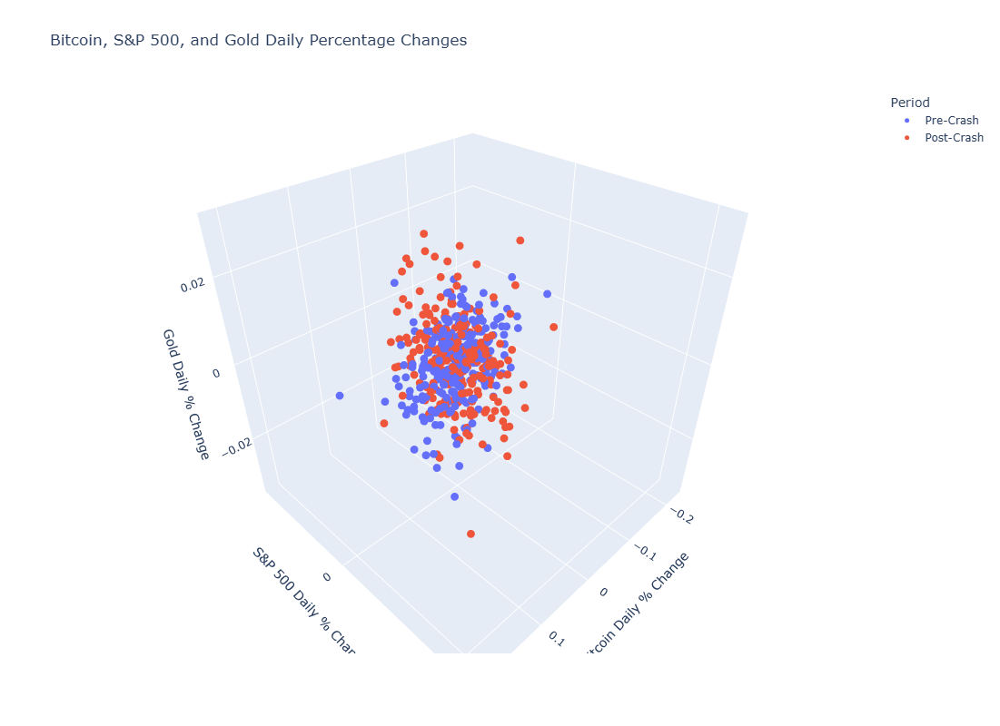

In [103]:
# 3D Scatter Plot
# Add a third dimension (e.g., Gold percentage change) to analyze correlations between Bitcoin, S&P 500, and Gold.
fig = px.scatter_3d(
    combined_data,
    x='Bitcoin_pct_change',
    y='SP500_pct_change',
    z='Gold_pct_change',
    color='Period',
    title='Bitcoin, S&P 500, and Gold Daily Percentage Changes',
    labels={
        'Bitcoin_pct_change': 'Bitcoin Daily % Change',
        'SP500_pct_change': 'S&P 500 Daily % Change',
        'Gold_pct_change': 'Gold Daily % Change'
    },
    width=1000,  
    height=800   
)
fig.update_traces(marker=dict(size=5))  # Customize marker size
fig.show()

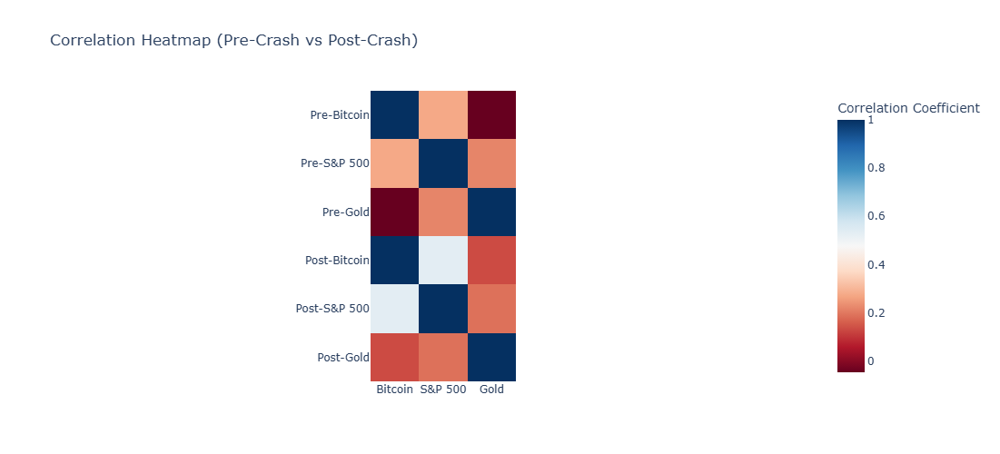

In [47]:
# Correlation Heatmap

# Visualize how correlations between assets differ in pre-crash and post-crash periods.
import numpy as np
pre_corr = pre_crash[['Bitcoin_pct_change', 'SP500_pct_change', 'Gold_pct_change']].corr()
post_corr = post_crash[['Bitcoin_pct_change', 'SP500_pct_change', 'Gold_pct_change']].corr()

fig = px.imshow(
    np.vstack([pre_corr.values, post_corr.values]),  # Stack pre and post correlations
    x=['Bitcoin', 'S&P 500', 'Gold'],
    y=['Pre-Bitcoin', 'Pre-S&P 500', 'Pre-Gold', 'Post-Bitcoin', 'Post-S&P 500', 'Post-Gold'],
    color_continuous_scale='RdBu',
    title='Correlation Heatmap (Pre-Crash vs Post-Crash)',
    labels={'color': 'Correlation Coefficient'}
)
fig.update_layout(
    width=500,
    height=500
)
fig.show()

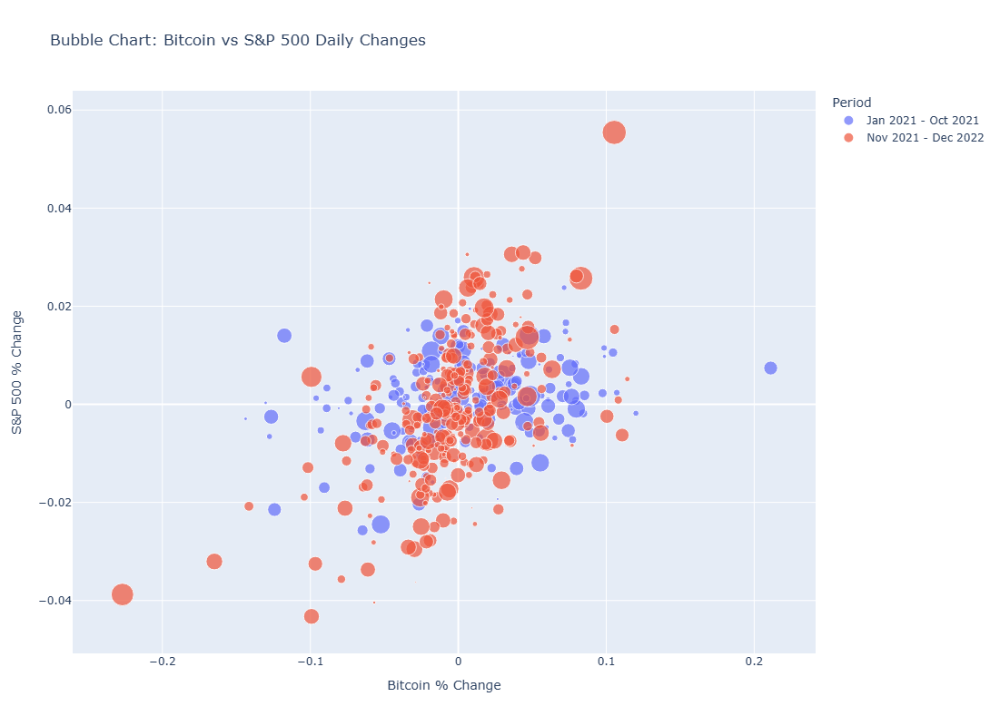

In [50]:
# Bubble Chart

import plotly.express as px

# Show the magnitude of percentage changes using bubble size.
fig = px.scatter(
    merged_data,
    x='Bitcoin_pct_change',
    y='SP500_pct_change',
    size=abs(merged_data['Gold_pct_change']),  # Bubble size based on Gold changes
    color='Period',
    title='Bubble Chart: Bitcoin vs S&P 500 Daily Changes',
    labels={'Bitcoin_pct_change': 'Bitcoin % Change', 'SP500_pct_change': 'S&P 500 % Change'}
)
fig.update_layout(
    width=1100,
    height=800
)
fig.show()

In [ ]:
## Bubble Chart Conclusions:

# The chart offers a multidimensional perspective on the behavior of Bitcoin, S&P 500, and Gold during different market phases, 
# highlighting the interactions between traditional assets (like Gold and S&P 500) and digital assets (like Bitcoin) during periods 
# of market uncertainty.

# Bitcoin and S&P 500 display a slightly positive correlation in their daily percentage changes, 
# especially following significant market disruptions (Post-Crash).

# The Pre-Crash period (depicted in blue) is characterized by smaller bubbles, indicating that Gold's price changes were relatively modest compared 
# to the Post-Crash period (depicted in red).

In [ ]:
## The scatterplots visually support these observations:

# Bitcoin vs. S&P 500: Post-crash, the scatterplot suggests a tighter clustering around a diagonal line, indicating stronger alignment between 
# the two assets.

# Bitcoin vs. Gold: The scatterplot remains diffuse both pre- and post-crash, reflecting the weak correlation between these two assets.

# Gold vs. S&P 500: The scatterplot indicates minimal clustering, highlighting the continued weak relationship between these two assets.

In [ ]:
## Conclusions to the Correlation Analysis:

# The correlation analysis reveals that during the Crypto Winter of 2022, Bitcoin began to behave more similarly to traditional financial assets, 
# particularly the SP500. This shift could be interpreted as a reflection of market-wide risk-off sentiment, where investors started treating Bitcoin 
# as a risk asset more aligned with equities, rather than as a stand-alone speculative or safe-haven asset like Gold.

In [ ]:
### General Conclusion to Price Stability During Economic Events:

# Price stability during economic events is a critical indicator of market confidence and resilience. 
# While traditional assets like gold and the S&P 500 often exhibit increased volatility in response to economic shocks, cryptocurrencies such as 
# Bitcoin may display differing behavior, including both heightened and reduced volatility depending on market sentiment and investor composition. 
# Importantly, changes in volatility do not always align with changes in correlation—assets can become more synchronized in movement even 
# as their price fluctuations diverge. Understanding these dynamics is essential for investors and policymakers seeking to navigate complex market 
# environments and maintain financial stability.